In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

from matplotlib import pyplot as plt

import simulate_data.simulate_data as sd

In [20]:
replications = 1 #formerly replications were performed on same dataset, now version is used to reflect the seed
thin = 0.1
versions = 1 #200
n_chains = 4
n_samples=2000
n_burn = [2000]
n=250
tree_count= [5,10,30,40,50,100,150,200]
sigma_a_list = [3.0,5.0,10.0]
q_list = [0.5,0.75,0.9,0.99]

seed_val=0
vi=0

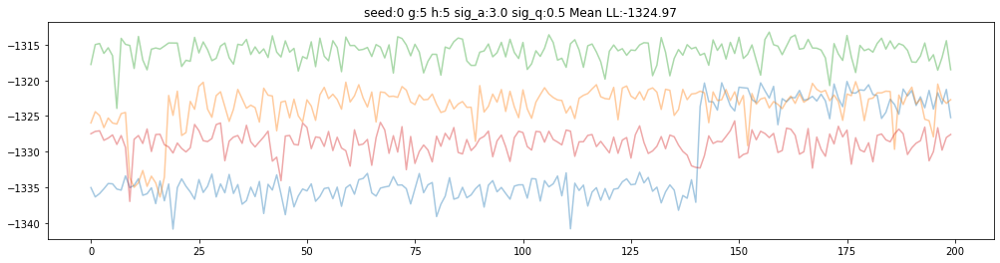

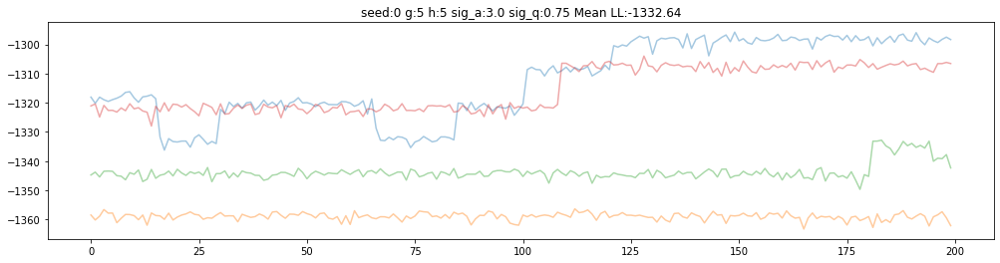

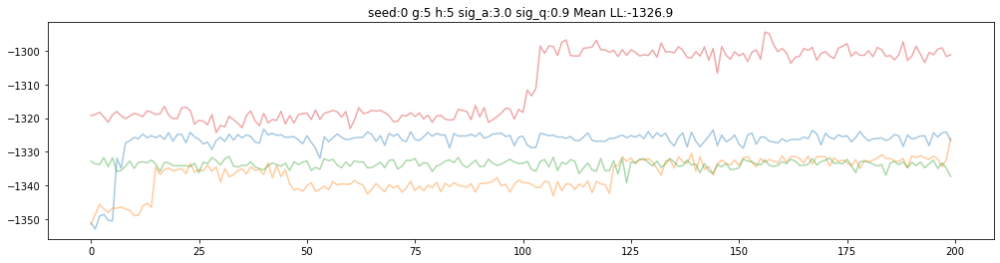

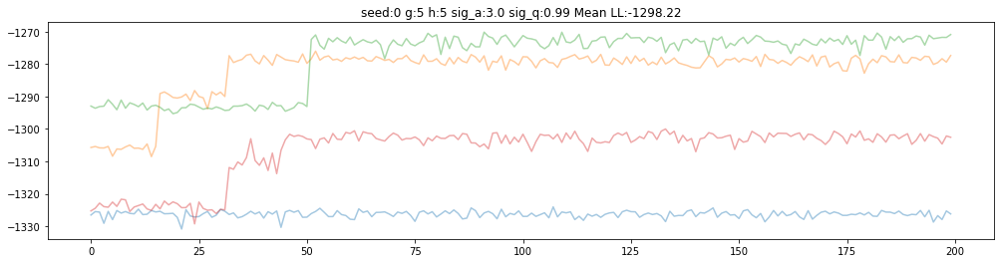

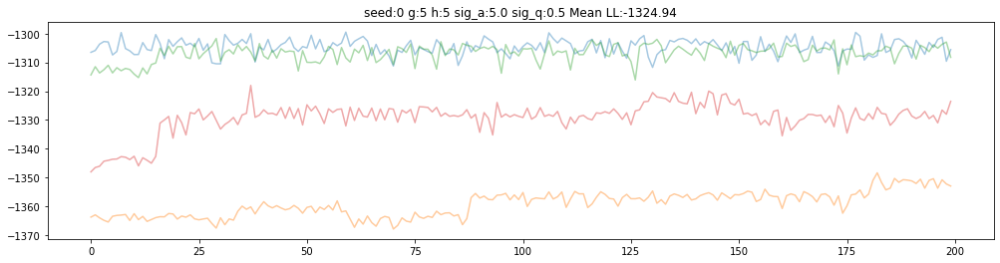

...

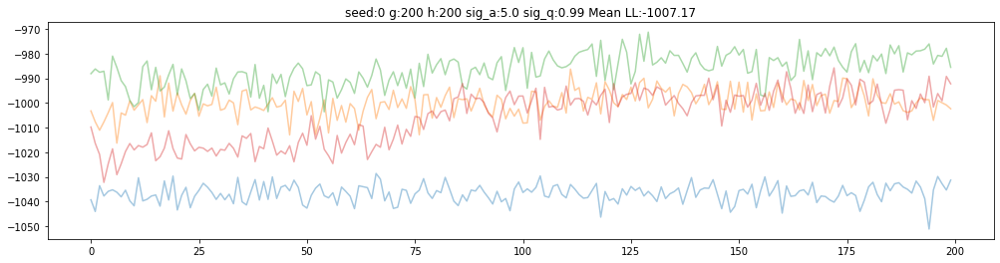

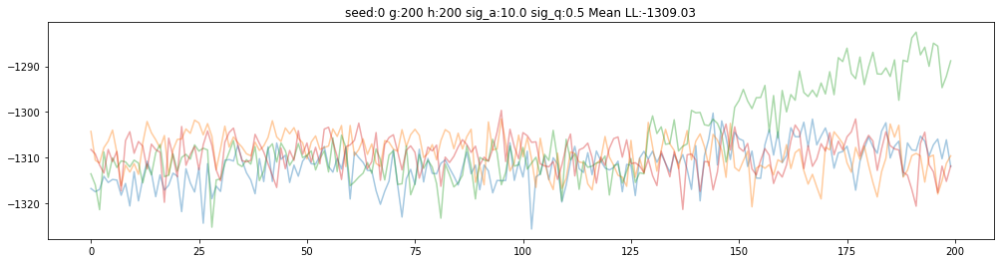

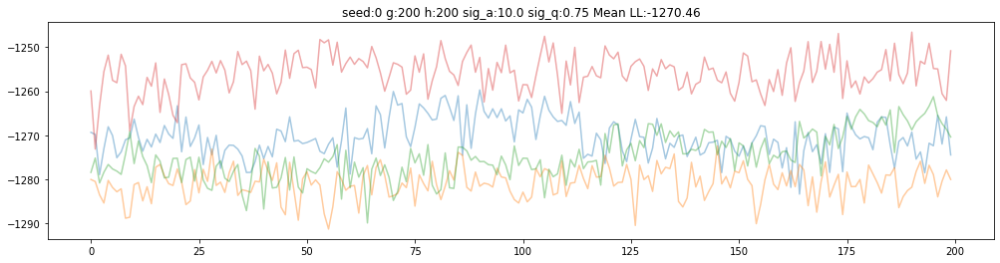

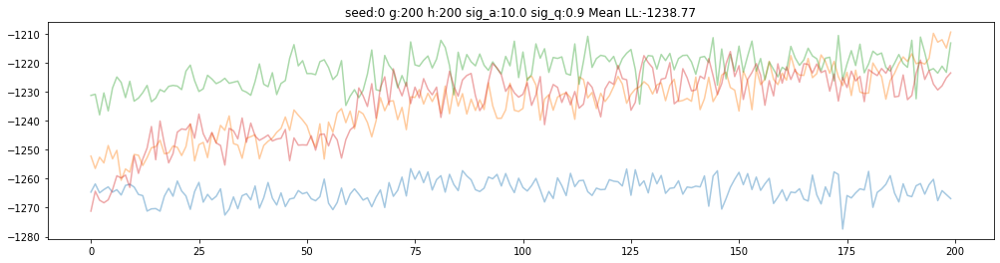

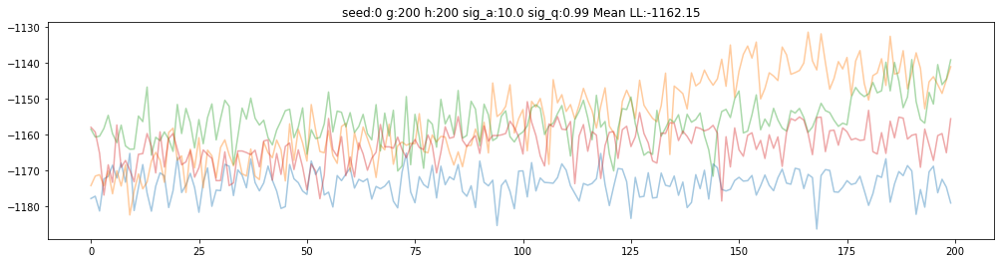

In [21]:
path = "experiment_results/A/known/CBARTMM/"
mean_LL = np.zeros(versions)
for tc in tree_count:
    for sa in sigma_a_list:
        for qi in q_list:
            #for vi in range(versions):
            # data
            data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")
            Y_i_star=np.array(data.Y_i_star)
            W=np.array(data.W)
            pi=np.array(data.p)
    
            for burn_i in n_burn:
                base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
                base_file_name_h = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_h.npy"
                base_file_name_sigma = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_sigma.npy"

                
                loaded_g = np.load(path + base_file_name_g)
                loaded_h = np.load(path + base_file_name_h)
                loaded_sigma = np.load(path + base_file_name_sigma)
                
                LL_s = np.zeros((int(n_samples*thin),n_chains))
                
                for c_i in range(n_chains):
                    for s_i in range(int(n_samples*thin)):
                        LL_s[s_i, c_i] = sd.CBARTMM_likelihood(
                            resp=Y_i_star,
                            W=W,p=pi,
                            g=loaded_g[:,s_i,c_i,replications-1], #-1 to start at 0
                            h=loaded_h[:,s_i,c_i,replications-1],
                            sigma=loaded_sigma[s_i, c_i,replications-1]
                        )
                mean_LL[vi] = np.mean(LL_s[:,:])
                plt.figure(figsize=(17,4))
                #plt.subplot(1,3,1)
                plt.title(
                    "seed:"+str(vi) + 
                    " g:" + str(tc) + 
                    " h:" + str(tc) +
                    " sig_a:" + str(sa) +
                    " sig_q:" + str(qi) +
                    " Mean LL:" + str(round(mean_LL[vi], 2))
                )
                _=plt.plot(LL_s[:,:], alpha = 0.4)
                _=plt.show()
                #plt.ylim(700,1000)

In [27]:
g_MSE = np.zeros(versions)
BIAS = np.zeros(versions)
TAU = np.zeros(versions)
h_MSE = np.zeros(versions)
tau_hat_error = np.zeros((versions, n))
all_tau = np.zeros((versions, n))
all_p = np.zeros((versions, n))
all_h = np.zeros((versions, n))
g_coverage = []
g_for_plot=[]
g_mse_for_plot=[]
h_coverage = []
h_for_plot=[]

data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")

tau=np.array(data.tau)
h = np.array(data["h(x)"])
        
for tc in tree_count:
    for sa in sigma_a_list:
        for qi in q_list:
            print("tree count:",tc,  " --- sigma a:", sa,  " --- sigma q:", qi)
    
            base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
            base_file_name_h = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_h.npy"
            base_file_name_sigma = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_sigma.npy"
    
            loaded_g = np.load(path + base_file_name_g)
            loaded_h = np.load(path + base_file_name_h)
            loaded_sig = np.load(path + base_file_name_sigma)
        
            tau_hat = np.mean(loaded_g, axis=(1,2,3))
            h_hat = np.mean(loaded_h, axis=(1,2,3))
            
            # determine coverage for g
            coverage_matrix=np.zeros((int(thin*n_samples*n_chains), n))
            for i in range(n_chains):
                coverage_matrix[i*int(thin*n_samples):(i+1)*int(thin*n_samples)]=loaded_g[:,:,i,0].T
                
            q975 = np.quantile( coverage_matrix, q=0.975, axis=0)
            q025 = np.quantile( coverage_matrix, q=0.025, axis=0)
            U=np.array(tau<q975).astype(int)
            L= np.array(q025<tau).astype(int)
    
            print("g_coverage:", np.mean(U*L))
            g_coverage.append(np.mean(U*L))
            g_for_plot.append(tc)
            g_mse_for_plot.append(np.mean((tau_hat-tau)**2))
            # determine coverage for h
            coverage_matrix=np.zeros((int(thin*n_samples)*n_chains, n))
            for i in range(n_chains):
                coverage_matrix[i*int(thin*n_samples):(i+1)*int(thin*n_samples)]=loaded_h[:,:,i,0].T
                
            q975 = np.quantile( coverage_matrix, q=0.975, axis=0)
            q025 = np.quantile( coverage_matrix, q=0.025, axis=0)
            U=np.array(h<q975).astype(int)
            L= np.array(q025<h).astype(int)
    
            print("h_coverage:", np.mean(U*L))
            h_coverage.append(np.mean(U*L))
            h_for_plot.append(tc)
            
            print("MSE:",round(np.mean((tau_hat-tau)**2), 2))
            print("MIL:", round(np.mean(q975-q025),2))
    

tree count: 5  --- sigma a: 3.0  --- sigma q: 0.5
g_coverage: 0.648
h_coverage: 0.664
MSE: 2557.91
MIL: 148.05
tree count: 5  --- sigma a: 3.0  --- sigma q: 0.75
g_coverage: 0.628
h_coverage: 0.624
MSE: 3062.03
MIL: 141.43
tree count: 5  --- sigma a: 3.0  --- sigma q: 0.9
g_coverage: 0.66
h_coverage: 0.568
MSE: 3107.75
MIL: 135.32
tree count: 5  --- sigma a: 3.0  --- sigma q: 0.99
g_coverage: 0.608
h_coverage: 0.464
MSE: 2828.54
MIL: 109.77
tree count: 5  --- sigma a: 5.0  --- sigma q: 0.5
g_coverage: 0.644
h_coverage: 0.56
MSE: 3007.65
MIL: 133.64
tree count: 5  --- sigma a: 5.0  --- sigma q: 0.75
g_coverage: 0.596
h_coverage: 0.652
MSE: 3179.31
MIL: 158.73
tree count: 5  --- sigma a: 5.0  --- sigma q: 0.9
g_coverage: 0.672
h_coverage: 0.516
MSE: 2919.69
MIL: 128.53
tree count: 5  --- sigma a: 5.0  --- sigma q: 0.99
g_coverage: 0.644
h_coverage: 0.512
MSE: 2647.5
MIL: 127.41
tree count: 5  --- sigma a: 10.0  --- sigma q: 0.5
g_coverage: 0.588
h_coverage: 0.412
MSE: 2879.89
MIL: 113.22

h_coverage: 0.584
MSE: 1993.16
MIL: 131.27
tree count: 200  --- sigma a: 5.0  --- sigma q: 0.5
g_coverage: 0.596
h_coverage: 0.452
MSE: 2052.0
MIL: 94.13
tree count: 200  --- sigma a: 5.0  --- sigma q: 0.75
g_coverage: 0.632
h_coverage: 0.556
MSE: 1853.94
MIL: 106.35
tree count: 200  --- sigma a: 5.0  --- sigma q: 0.9
g_coverage: 0.632
h_coverage: 0.536
MSE: 1792.18
MIL: 107.79
tree count: 200  --- sigma a: 5.0  --- sigma q: 0.99
g_coverage: 0.624
h_coverage: 0.596
MSE: 1865.12
MIL: 125.14
tree count: 200  --- sigma a: 10.0  --- sigma q: 0.5
g_coverage: 0.524
h_coverage: 0.384
MSE: 2411.6
MIL: 79.72
tree count: 200  --- sigma a: 10.0  --- sigma q: 0.75
g_coverage: 0.568
h_coverage: 0.42
MSE: 2023.91
MIL: 81.59
tree count: 200  --- sigma a: 10.0  --- sigma q: 0.9
g_coverage: 0.64
h_coverage: 0.504
MSE: 2003.89
MIL: 98.07
tree count: 200  --- sigma a: 10.0  --- sigma q: 0.99
g_coverage: 0.632
h_coverage: 0.52
MSE: 1883.36
MIL: 103.89


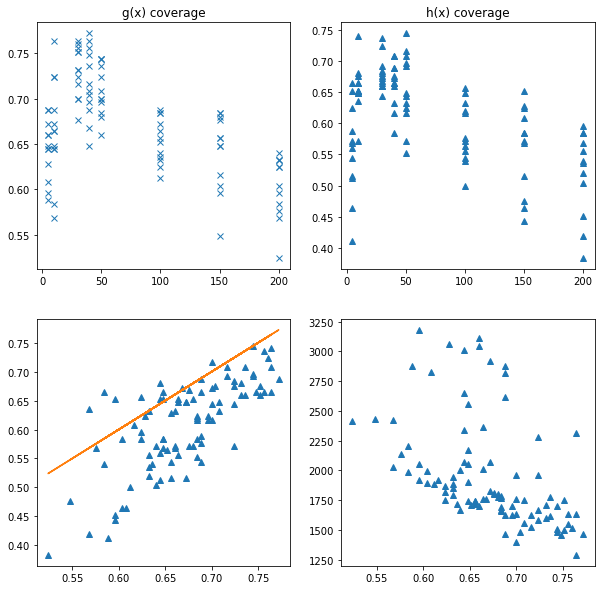

In [23]:
_=plt.figure(figsize=(10,10))
_=plt.subplot(2, 2, 1)
_=plt.plot(g_for_plot, g_coverage, 'x')
_=plt.title("g(x) coverage")

_=plt.subplot(2, 2, 2)
_=plt.plot(h_for_plot, h_coverage, '^')
_=plt.title("h(x) coverage")

_=plt.subplot(2, 2, 3)
_=plt.plot(g_coverage, h_coverage, '^')
_=plt.plot(g_coverage,g_coverage)

_=plt.subplot(2, 2, 4)
_=plt.plot(g_coverage, g_mse_for_plot, '^')


tree count: 5  --- sigma a: 3.0  --- sigma q: 0.5


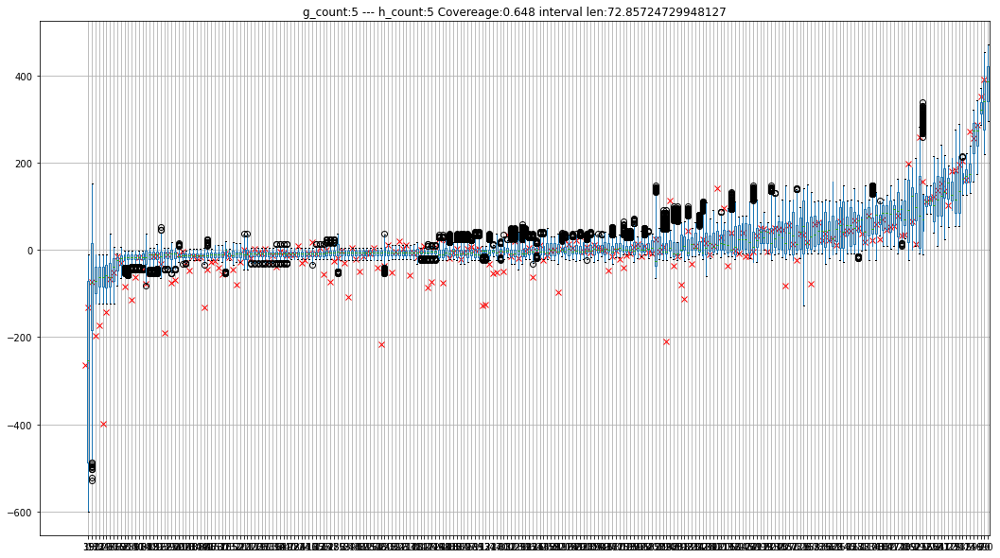

tree count: 5  --- sigma a: 3.0  --- sigma q: 0.75


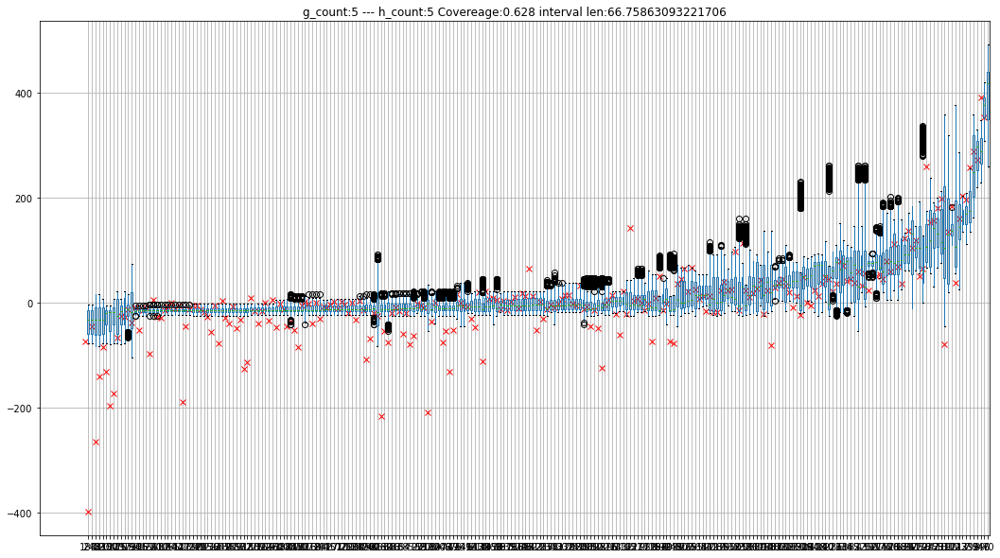

tree count: 5  --- sigma a: 3.0  --- sigma q: 0.9


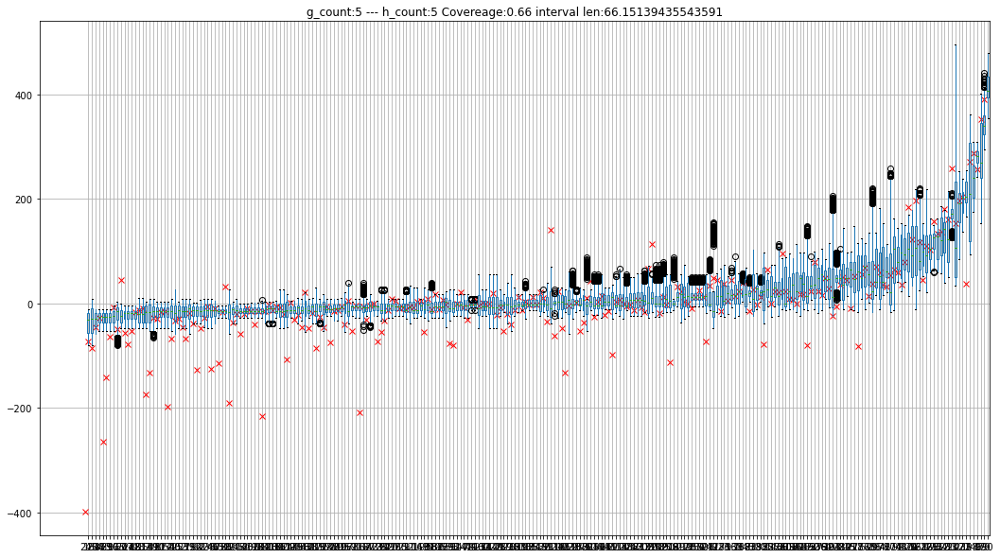

tree count: 5  --- sigma a: 3.0  --- sigma q: 0.99


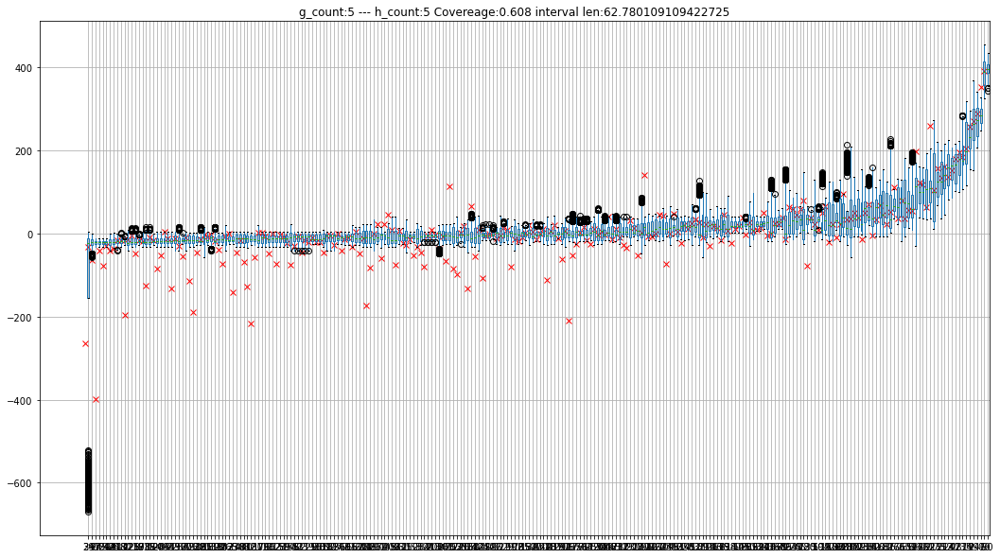

tree count: 5  --- sigma a: 5.0  --- sigma q: 0.5


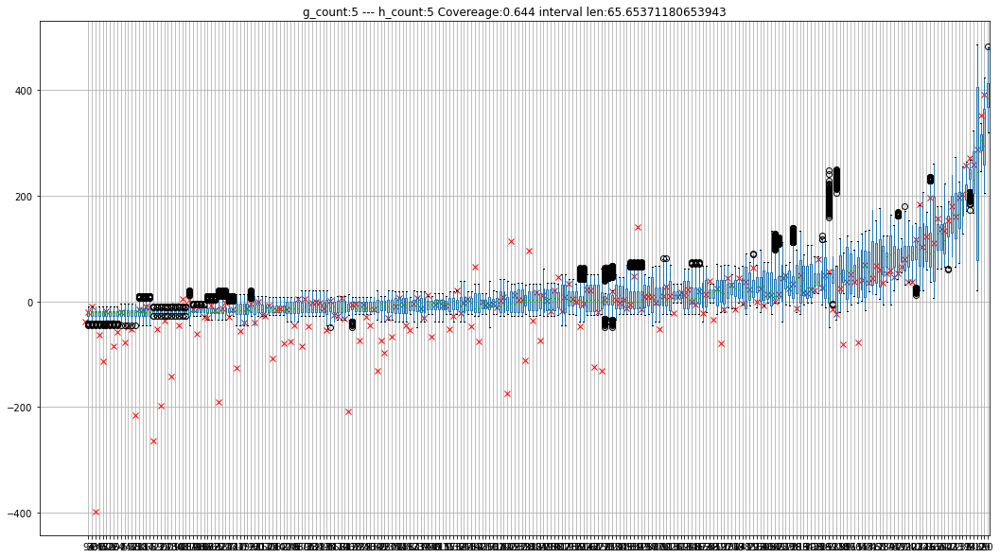

tree count: 5  --- sigma a: 5.0  --- sigma q: 0.75


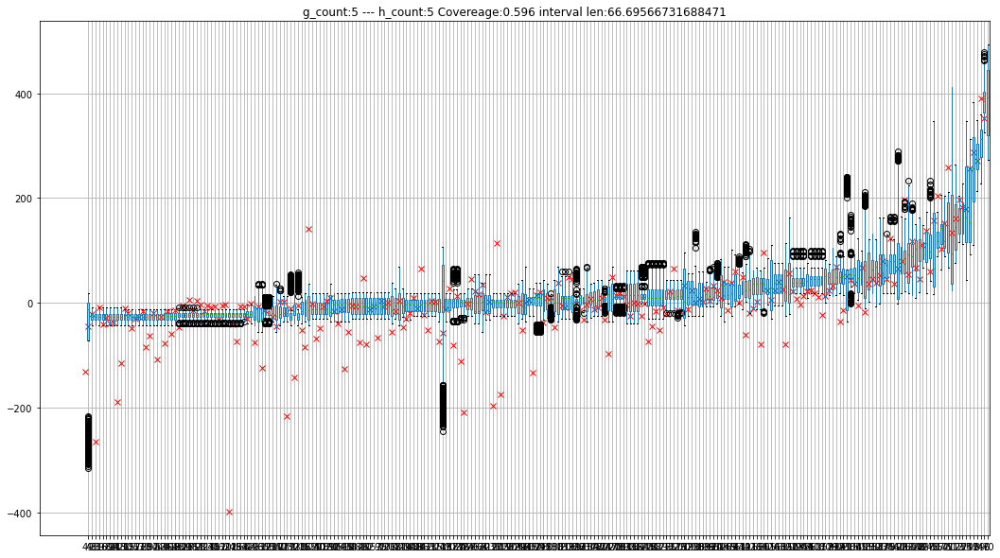

tree count: 5  --- sigma a: 5.0  --- sigma q: 0.9


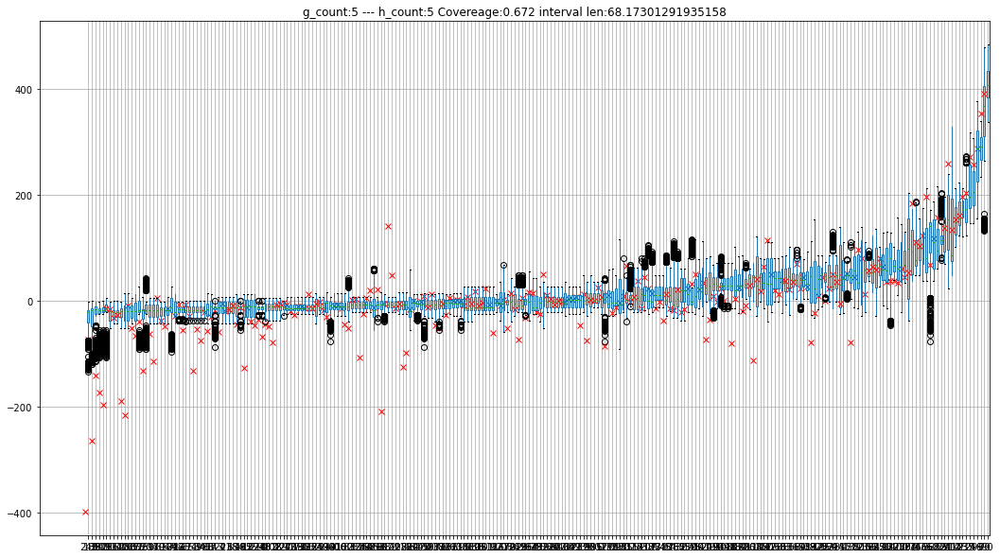

tree count: 5  --- sigma a: 5.0  --- sigma q: 0.99


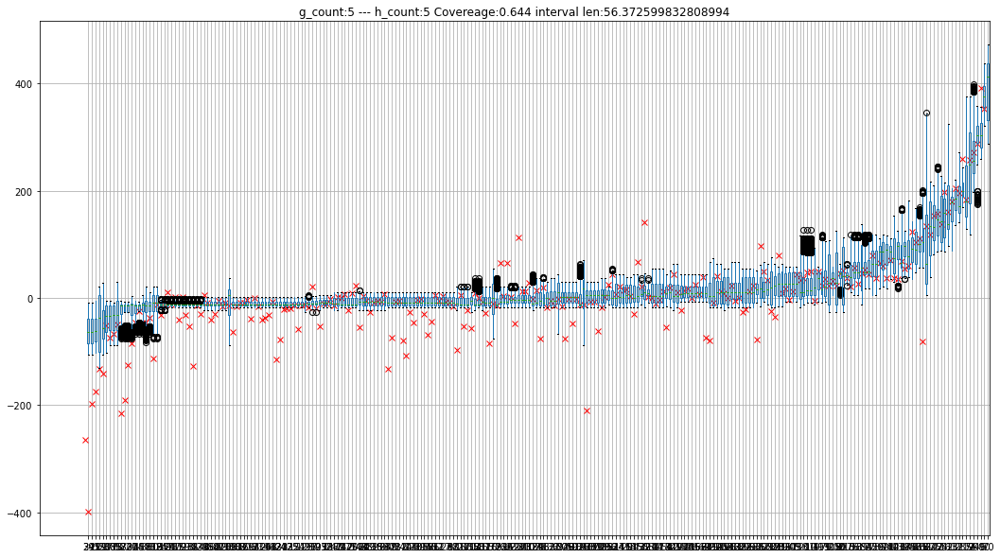

tree count: 5  --- sigma a: 10.0  --- sigma q: 0.5


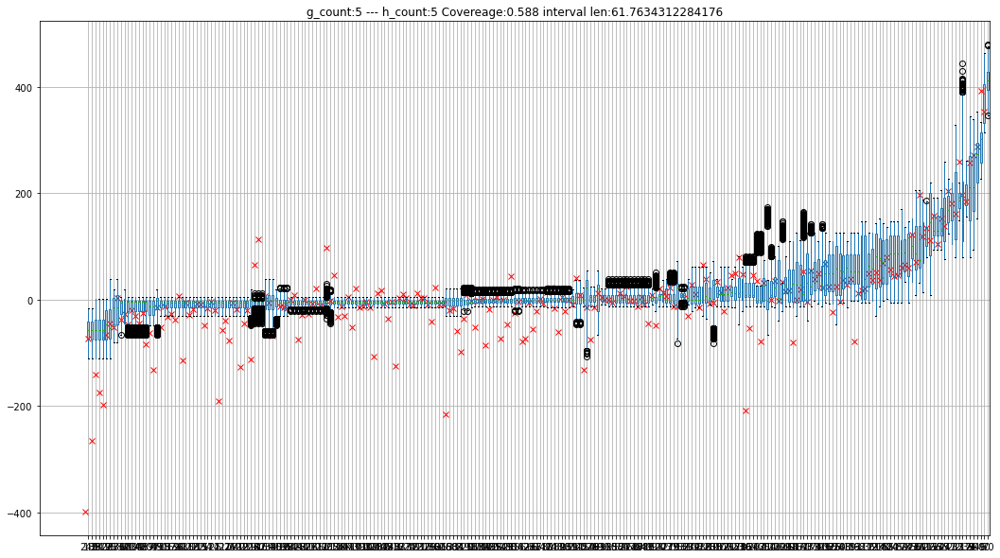

tree count: 5  --- sigma a: 10.0  --- sigma q: 0.75


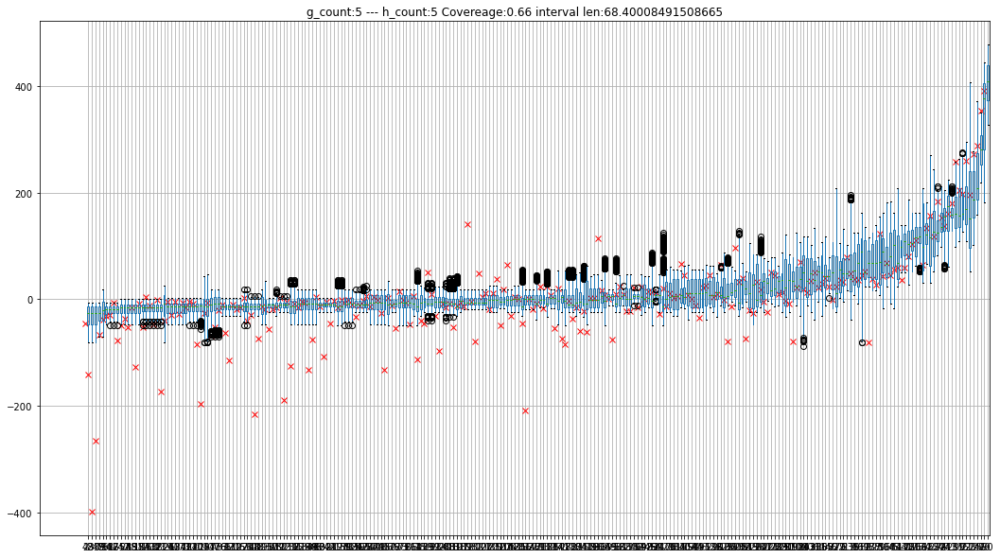

tree count: 5  --- sigma a: 10.0  --- sigma q: 0.9


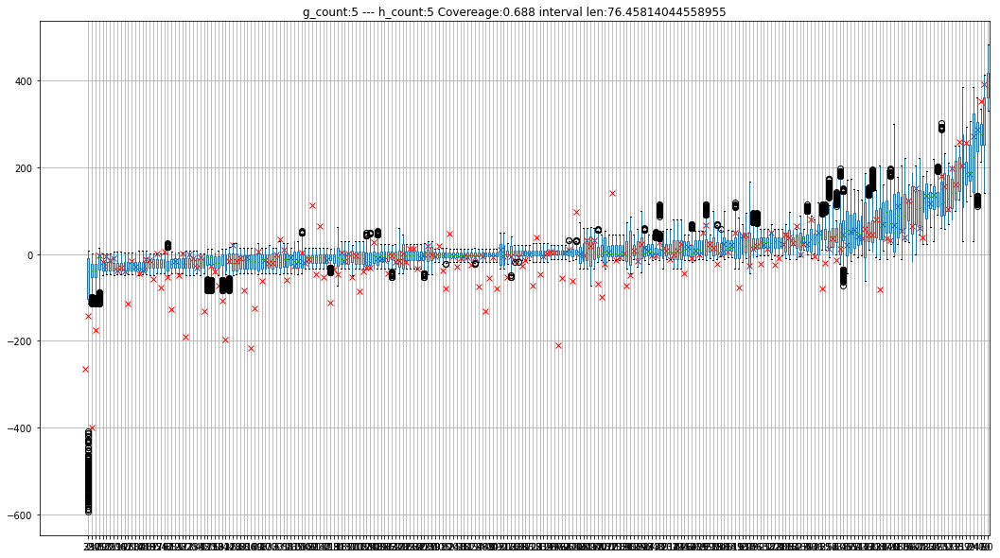

tree count: 5  --- sigma a: 10.0  --- sigma q: 0.99


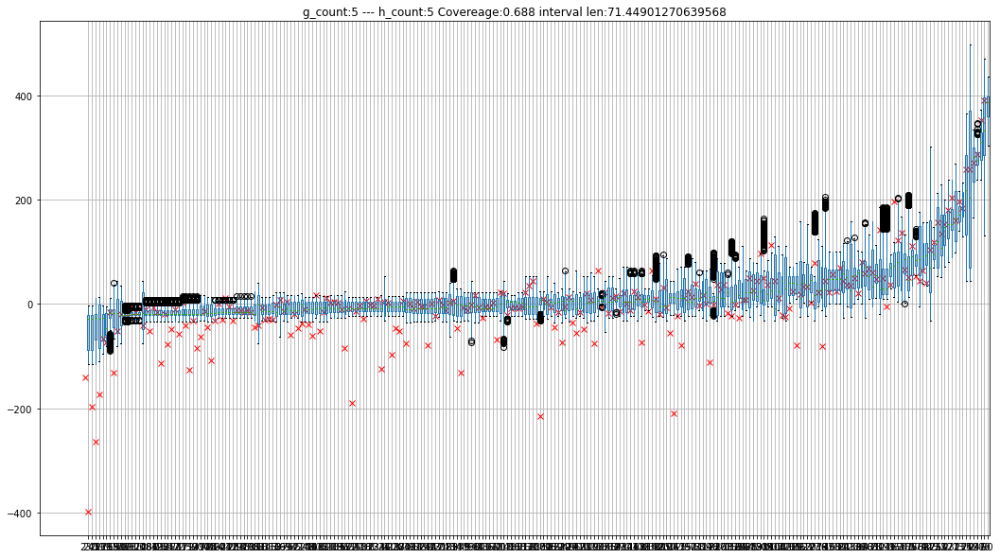

tree count: 10  --- sigma a: 3.0  --- sigma q: 0.5


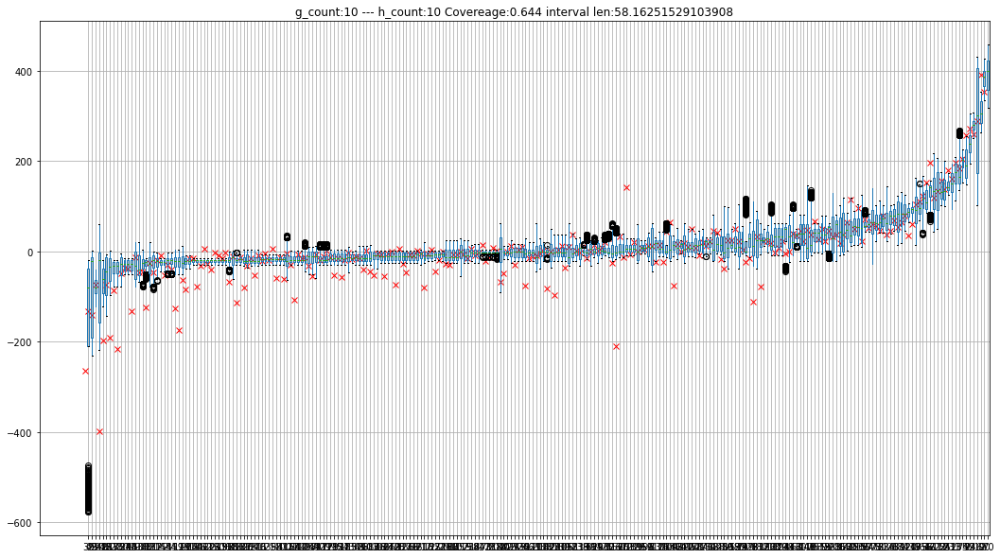

tree count: 10  --- sigma a: 3.0  --- sigma q: 0.75


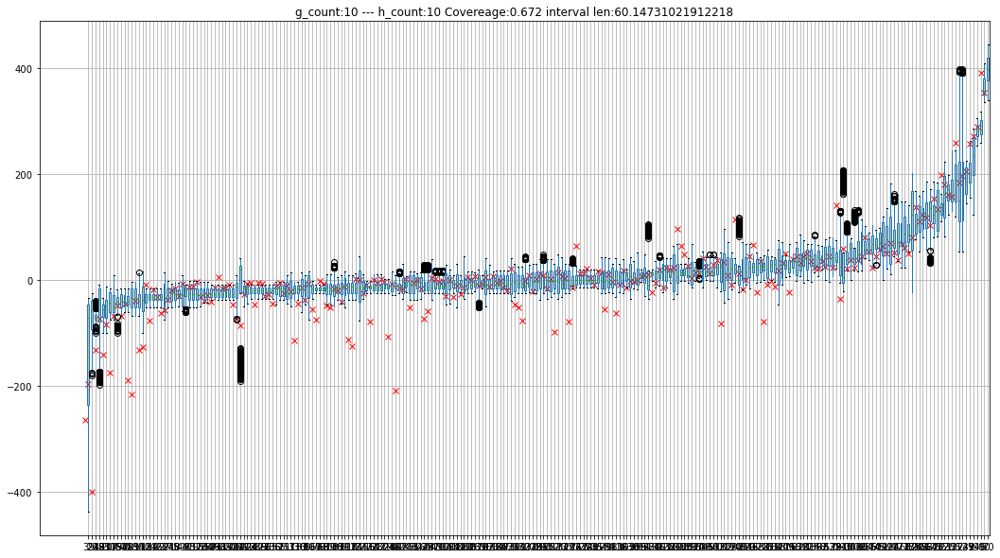

tree count: 10  --- sigma a: 3.0  --- sigma q: 0.9


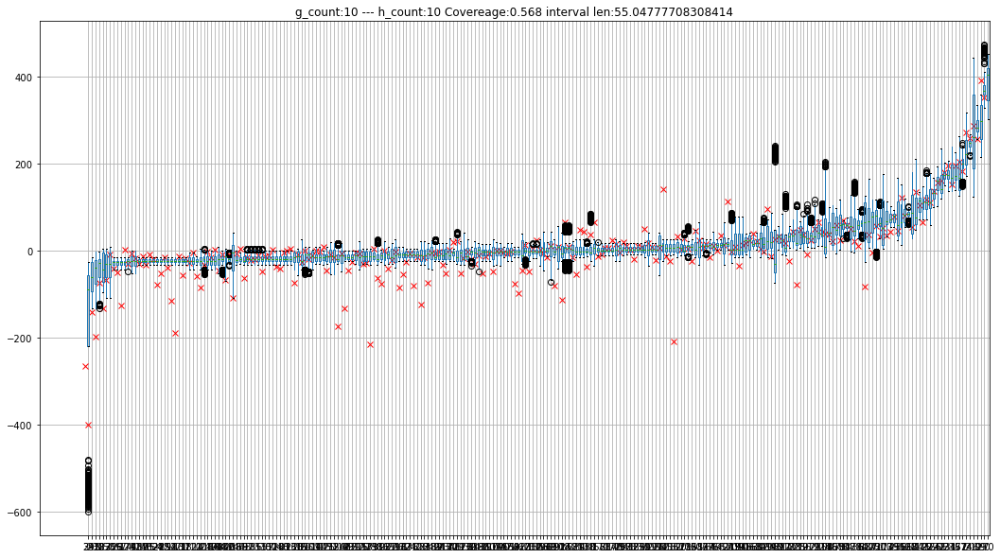

tree count: 10  --- sigma a: 3.0  --- sigma q: 0.99


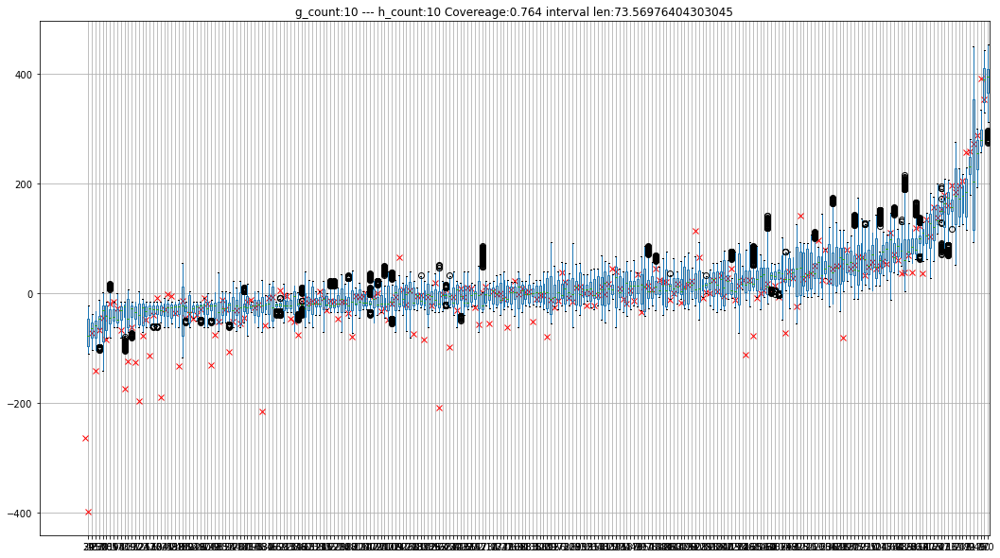

tree count: 10  --- sigma a: 5.0  --- sigma q: 0.5


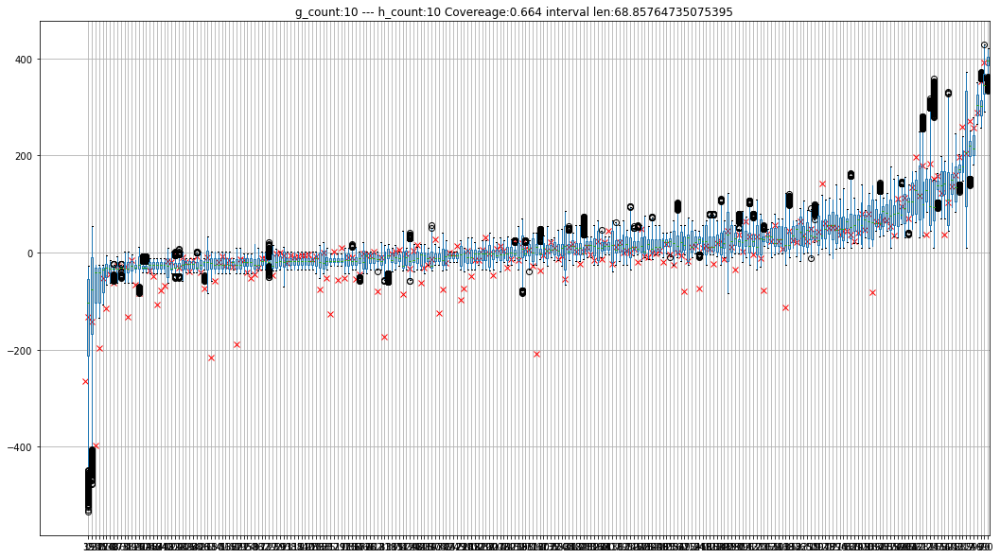

tree count: 10  --- sigma a: 5.0  --- sigma q: 0.75


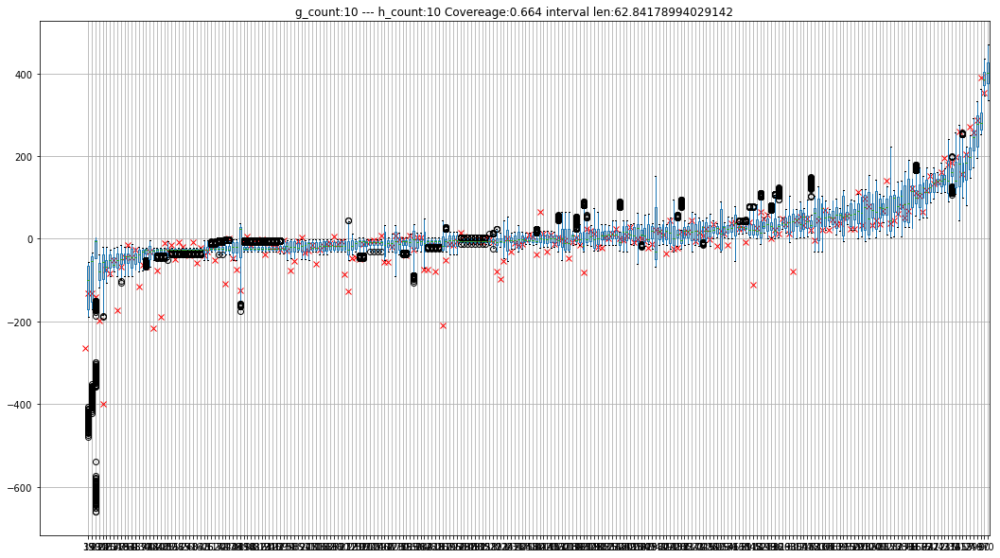

tree count: 10  --- sigma a: 5.0  --- sigma q: 0.9


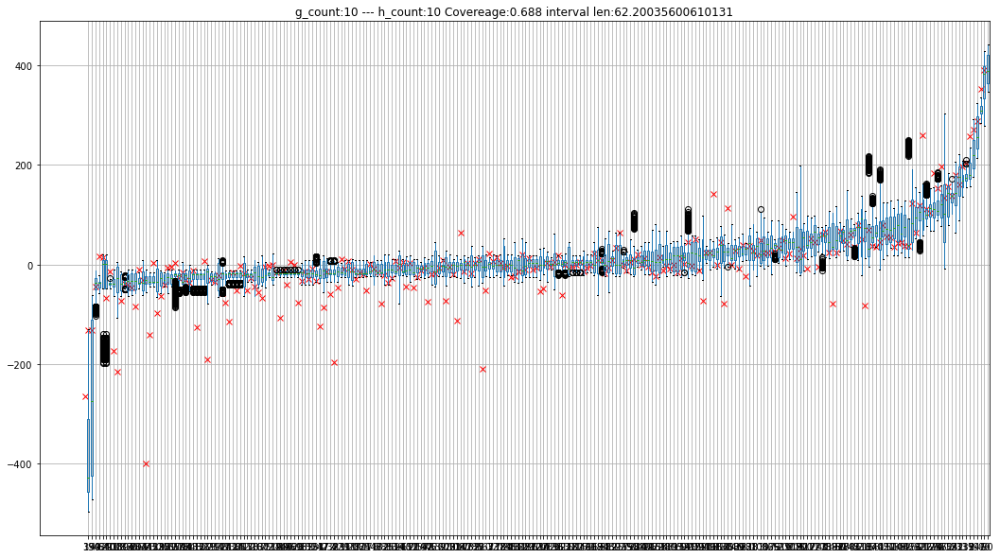

tree count: 10  --- sigma a: 5.0  --- sigma q: 0.99


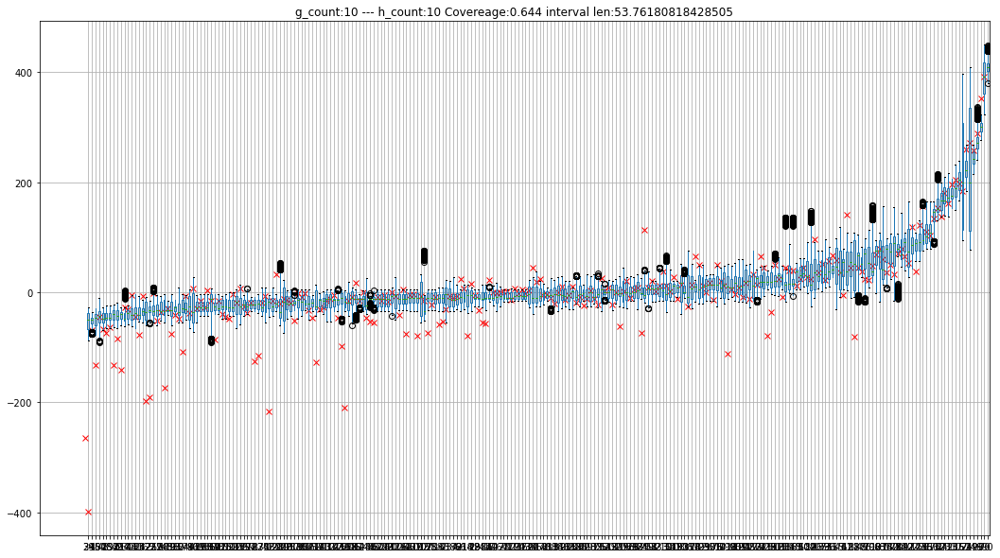

tree count: 10  --- sigma a: 10.0  --- sigma q: 0.5


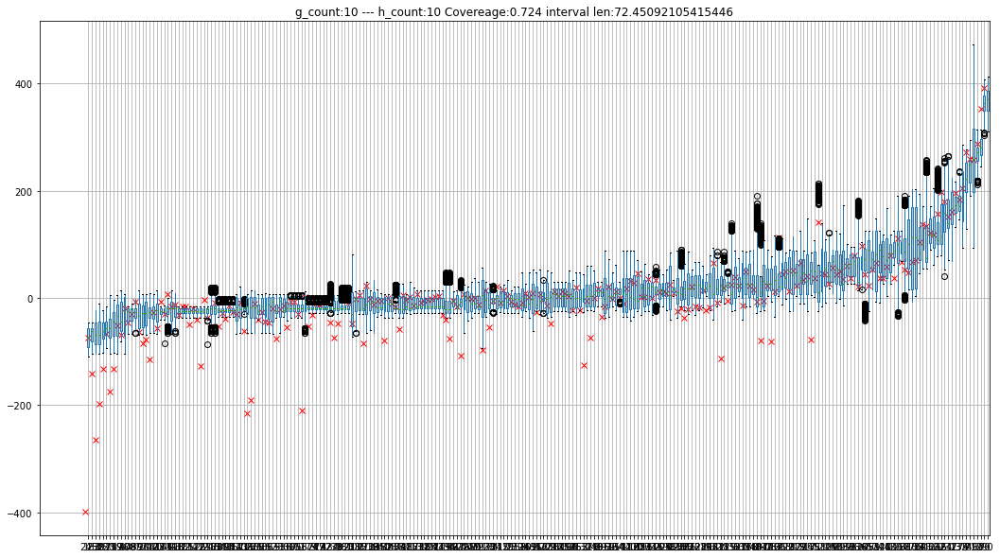

tree count: 10  --- sigma a: 10.0  --- sigma q: 0.75


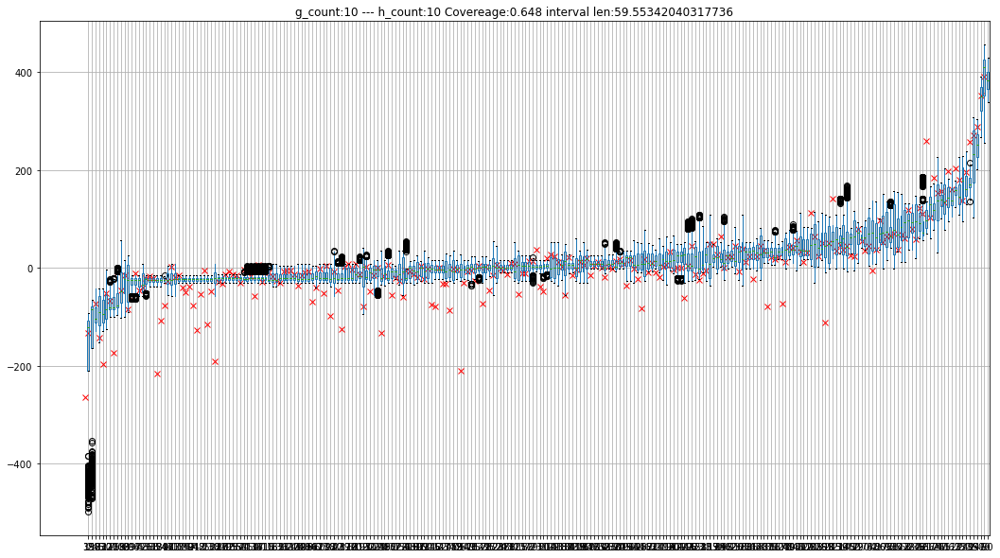

tree count: 10  --- sigma a: 10.0  --- sigma q: 0.9


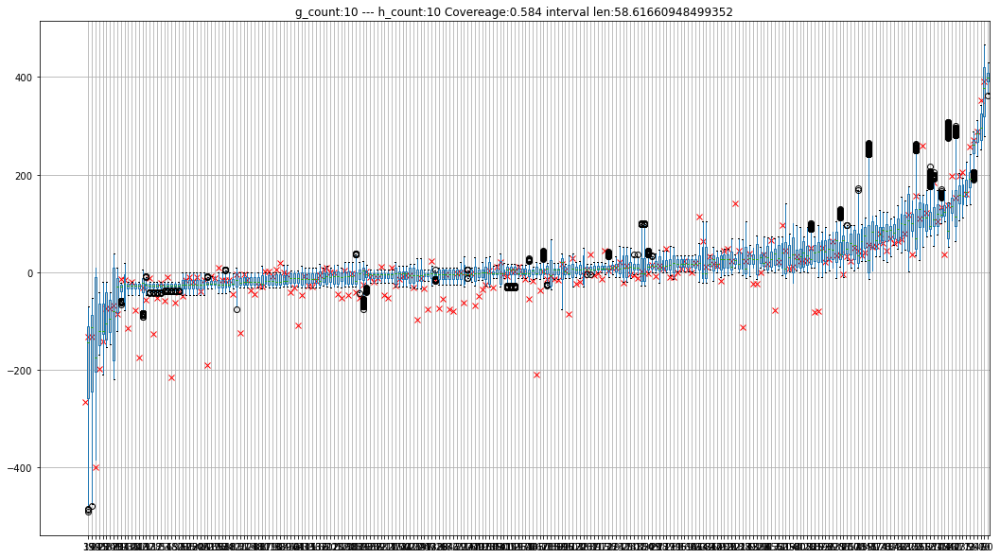

tree count: 10  --- sigma a: 10.0  --- sigma q: 0.99


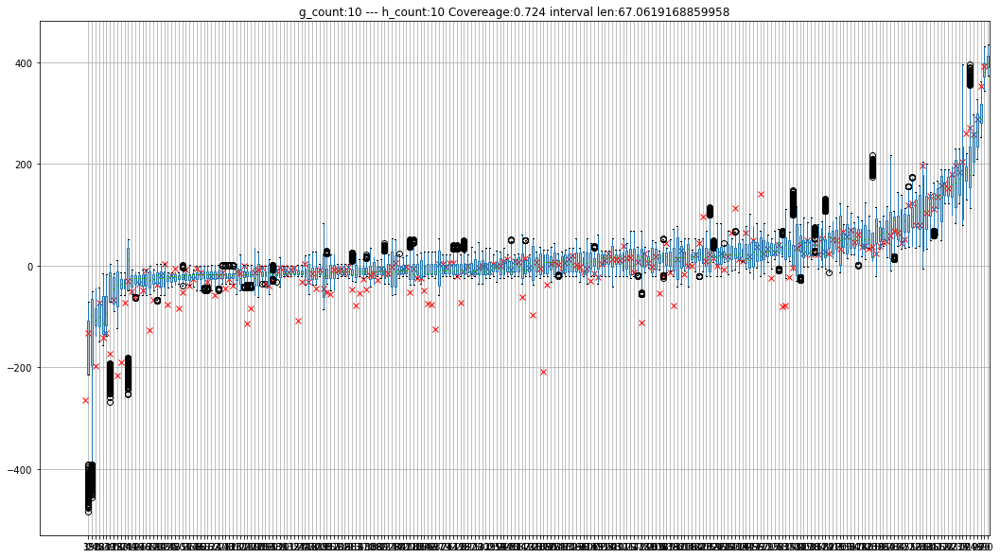

tree count: 30  --- sigma a: 3.0  --- sigma q: 0.5


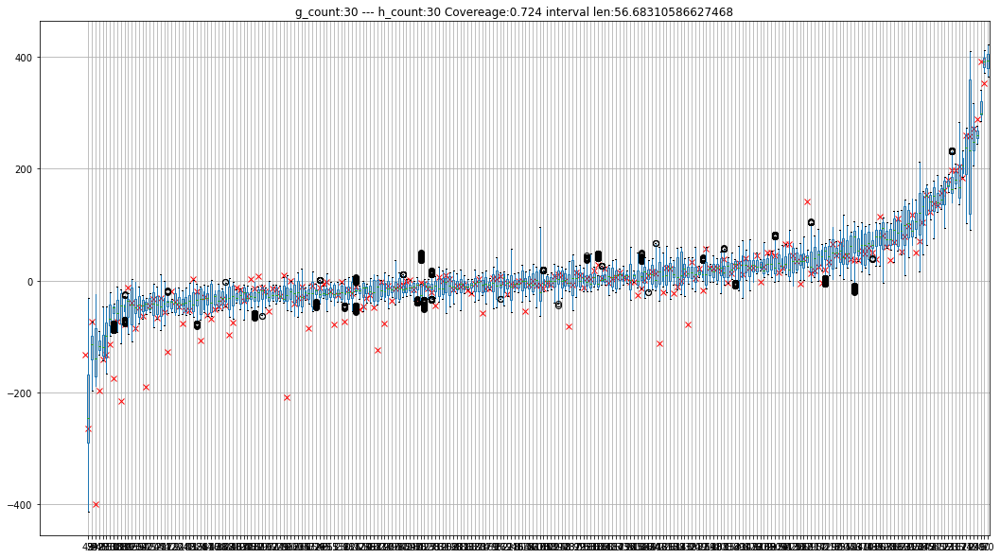

tree count: 30  --- sigma a: 3.0  --- sigma q: 0.75


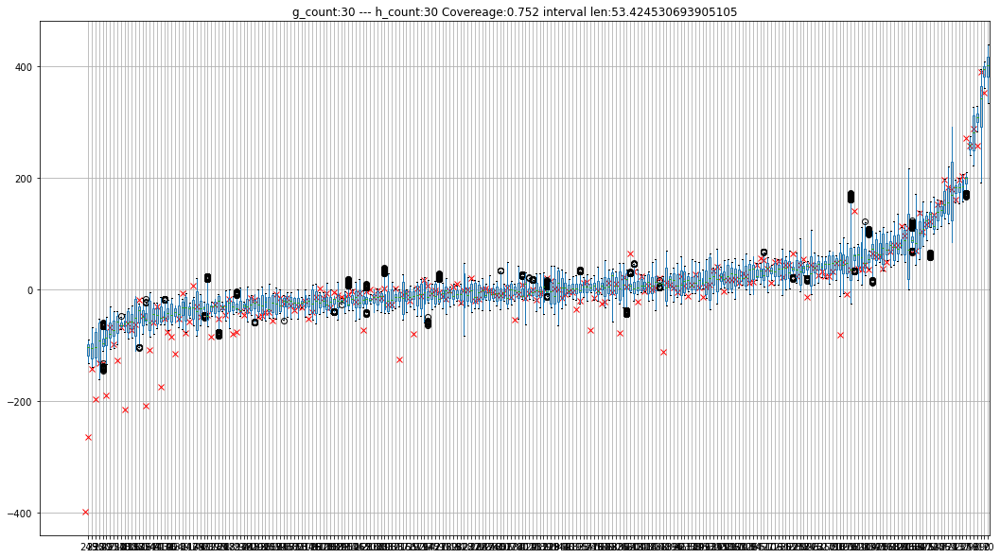

tree count: 30  --- sigma a: 3.0  --- sigma q: 0.9


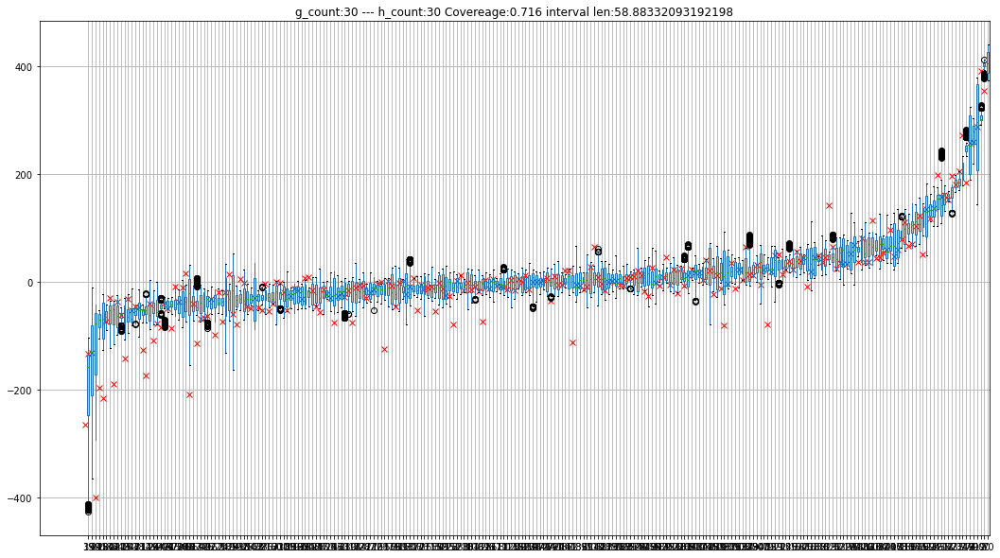

tree count: 30  --- sigma a: 3.0  --- sigma q: 0.99


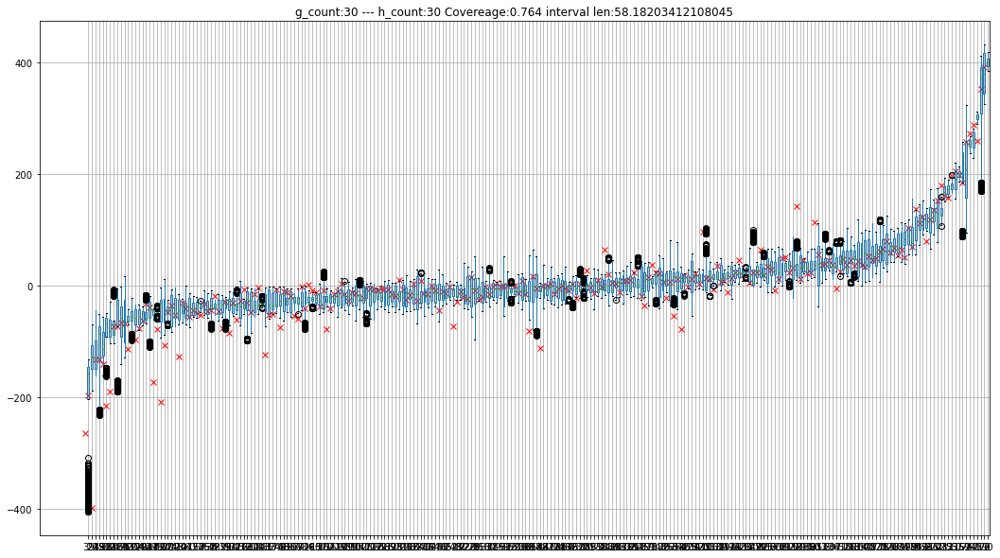

tree count: 30  --- sigma a: 5.0  --- sigma q: 0.5


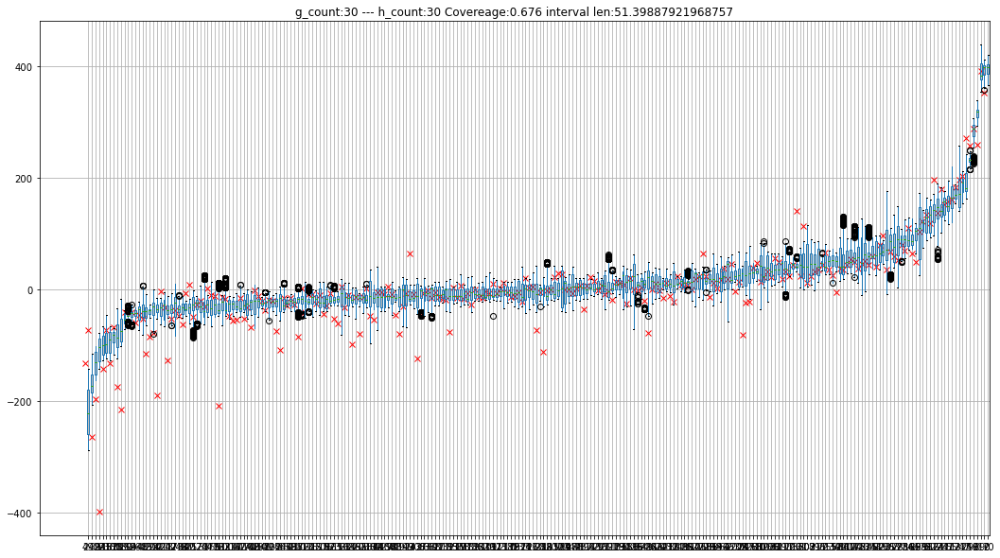

tree count: 30  --- sigma a: 5.0  --- sigma q: 0.75


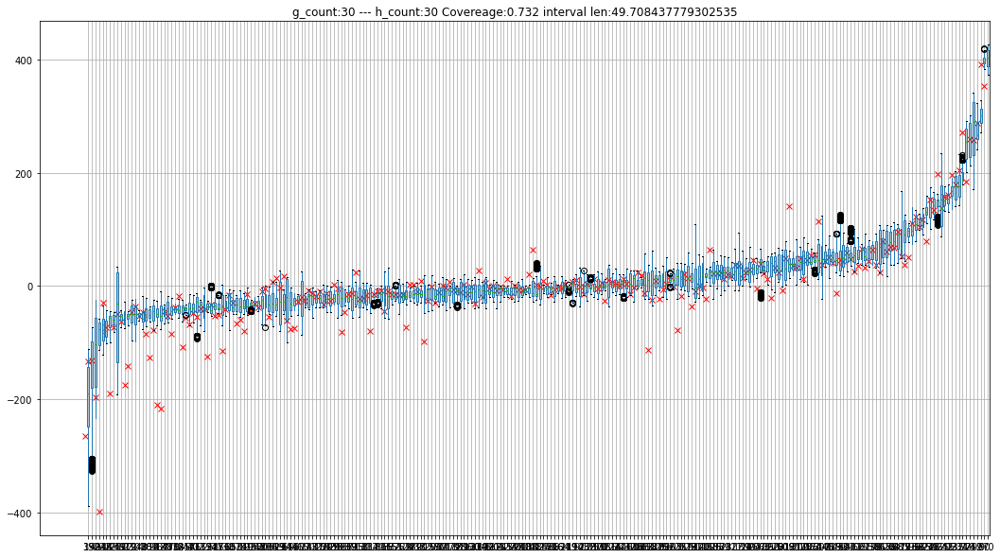

tree count: 30  --- sigma a: 5.0  --- sigma q: 0.9


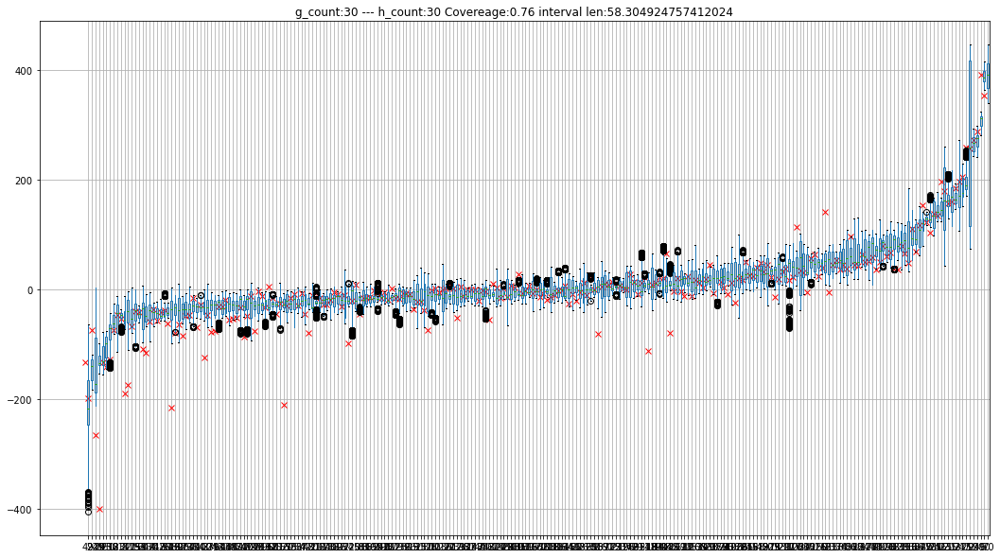

tree count: 30  --- sigma a: 5.0  --- sigma q: 0.99


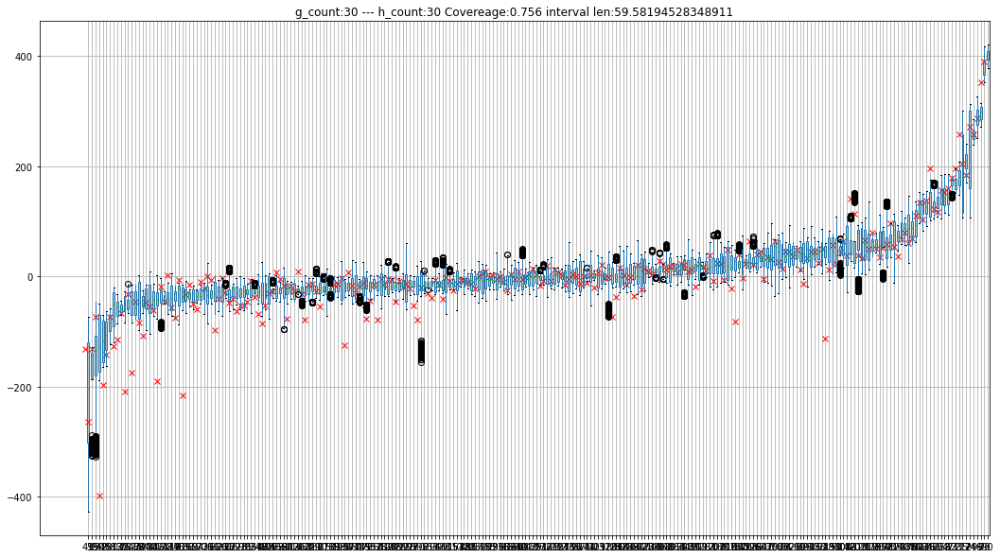

tree count: 30  --- sigma a: 10.0  --- sigma q: 0.5


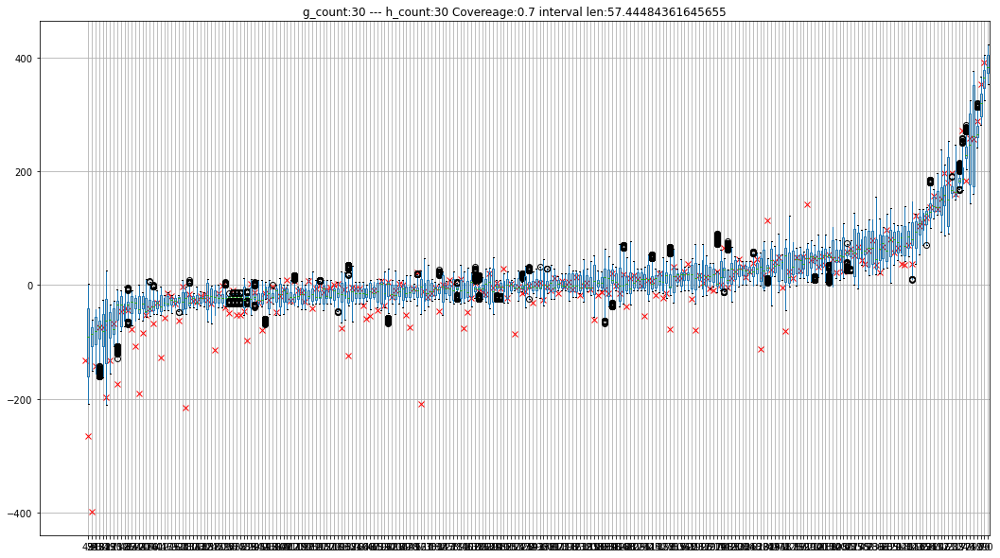

tree count: 30  --- sigma a: 10.0  --- sigma q: 0.75


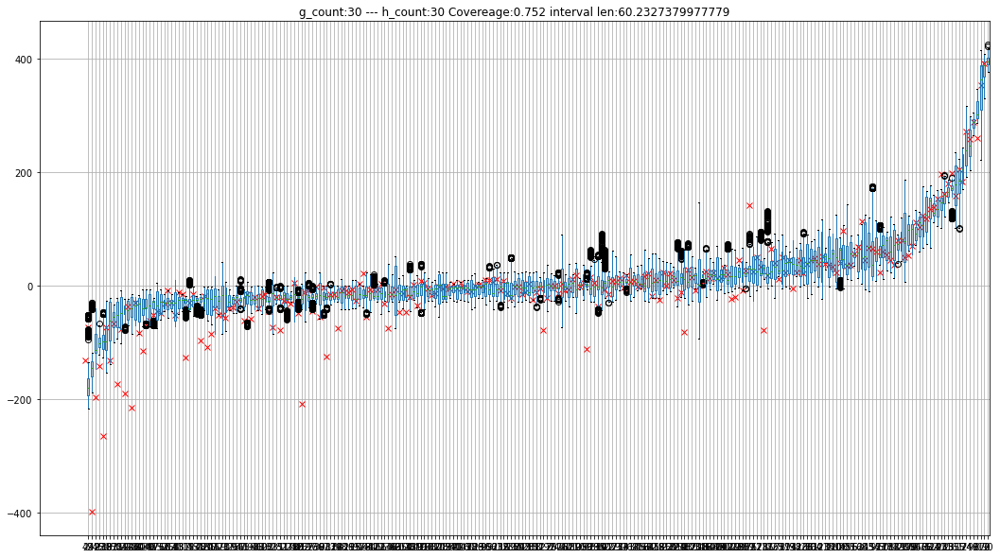

tree count: 30  --- sigma a: 10.0  --- sigma q: 0.9


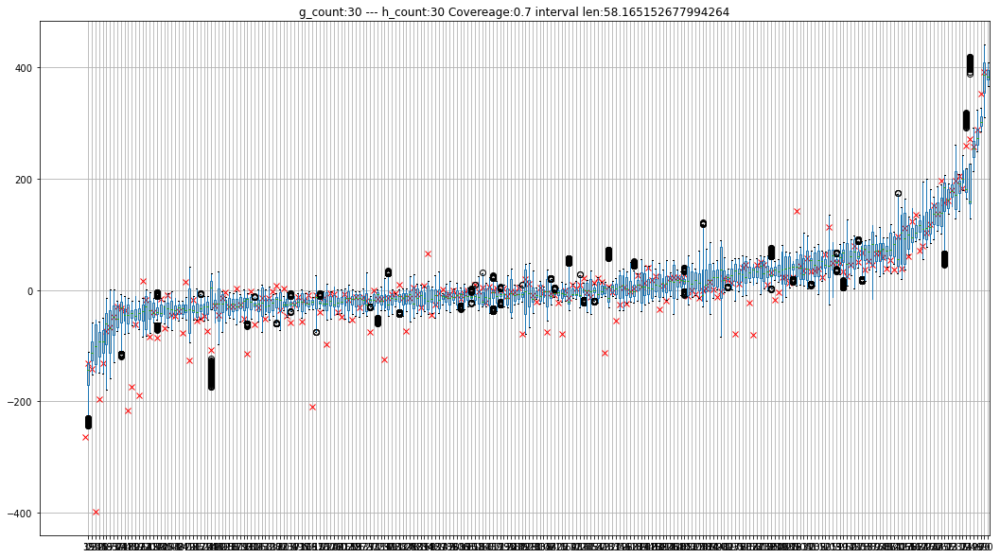

tree count: 30  --- sigma a: 10.0  --- sigma q: 0.99


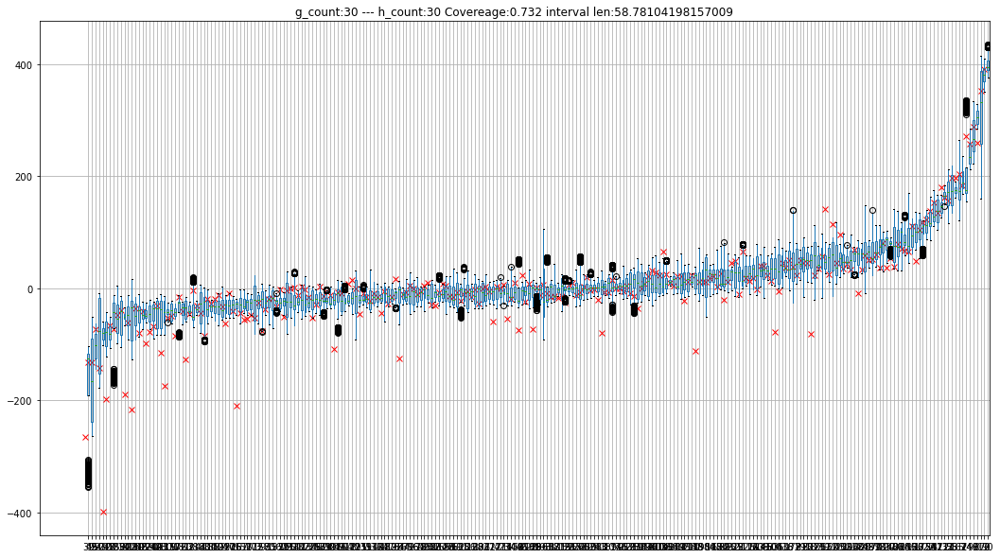

tree count: 40  --- sigma a: 3.0  --- sigma q: 0.5


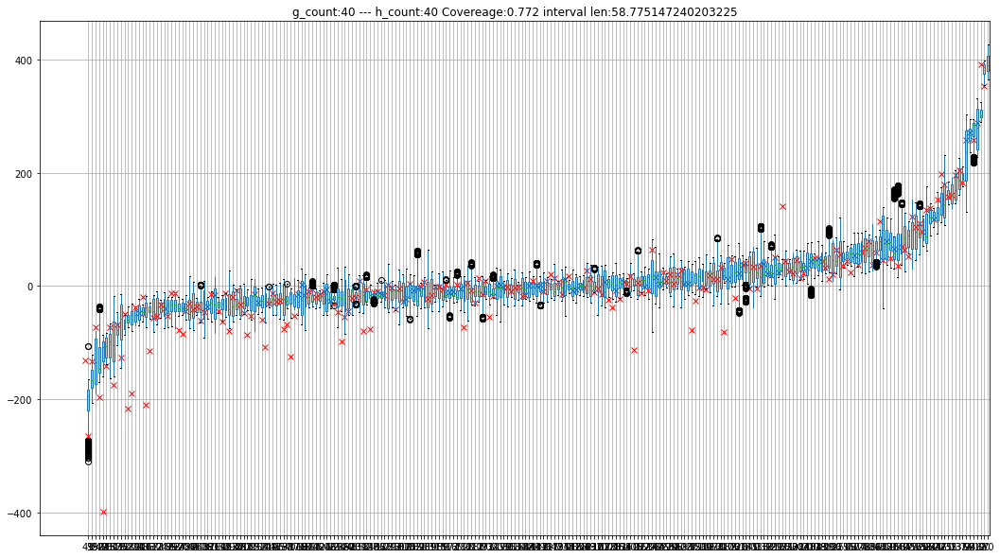

tree count: 40  --- sigma a: 3.0  --- sigma q: 0.75


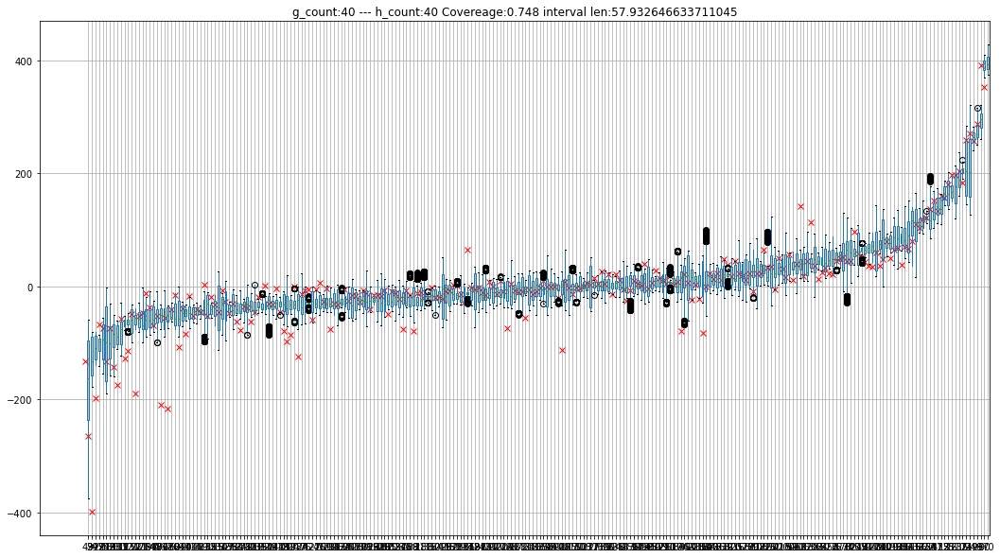

tree count: 40  --- sigma a: 3.0  --- sigma q: 0.9


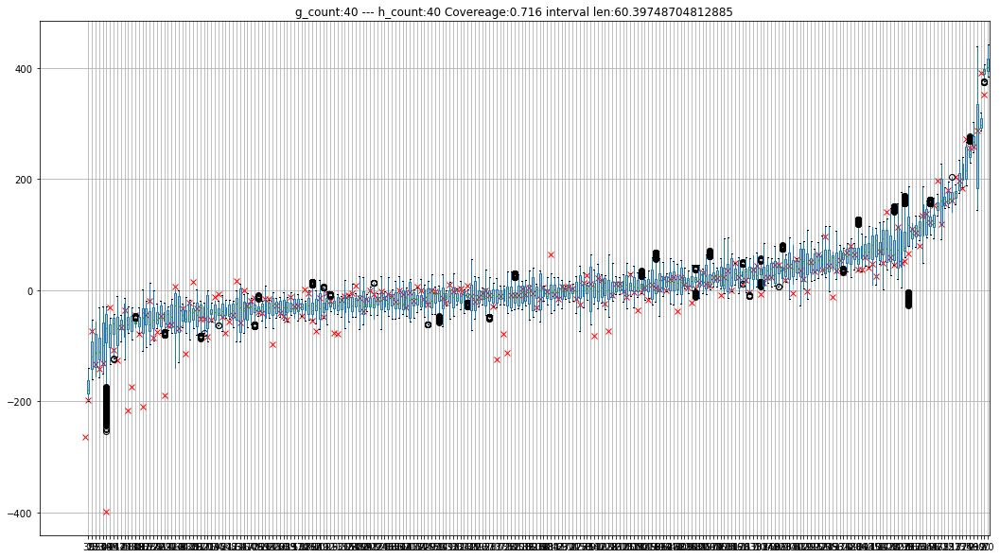

tree count: 40  --- sigma a: 3.0  --- sigma q: 0.99


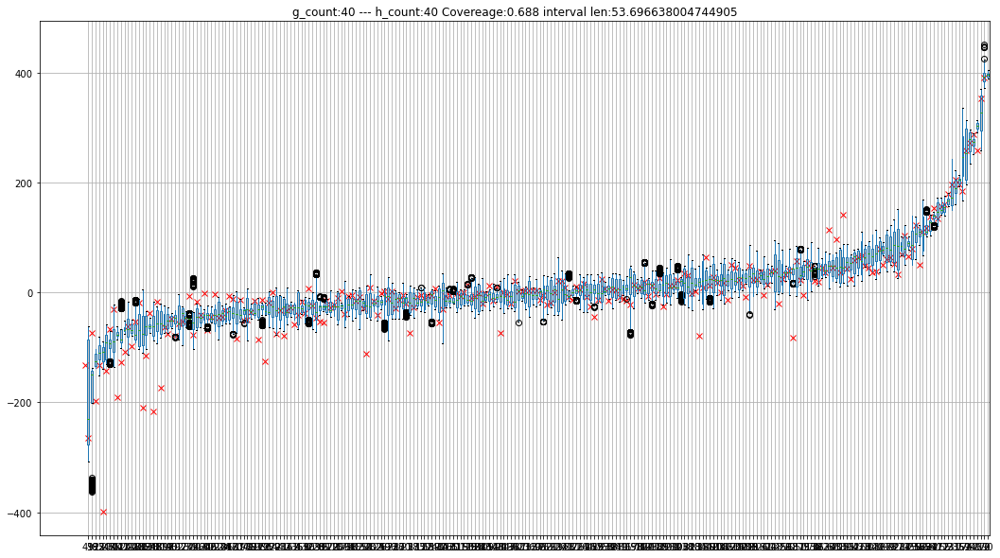

tree count: 40  --- sigma a: 5.0  --- sigma q: 0.5


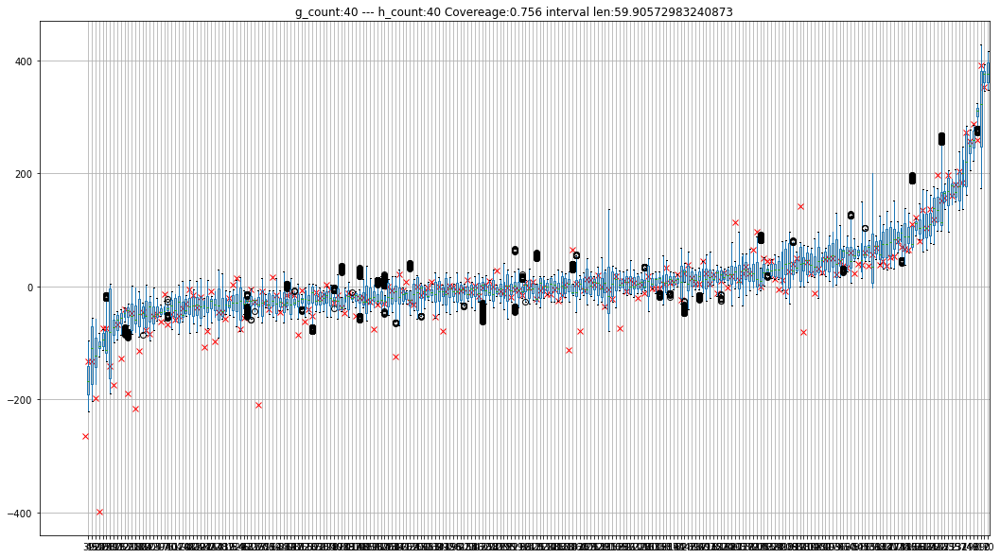

tree count: 40  --- sigma a: 5.0  --- sigma q: 0.75


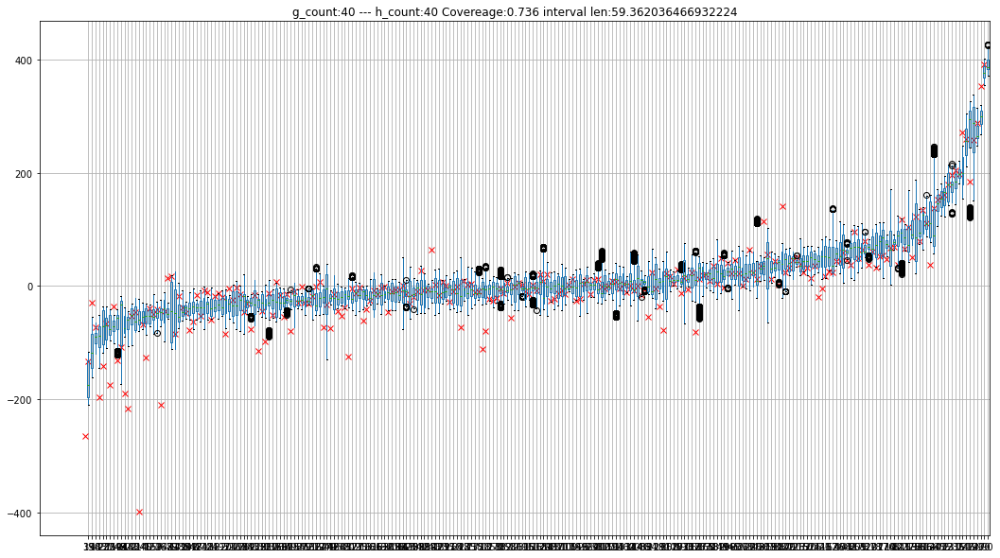

tree count: 40  --- sigma a: 5.0  --- sigma q: 0.9


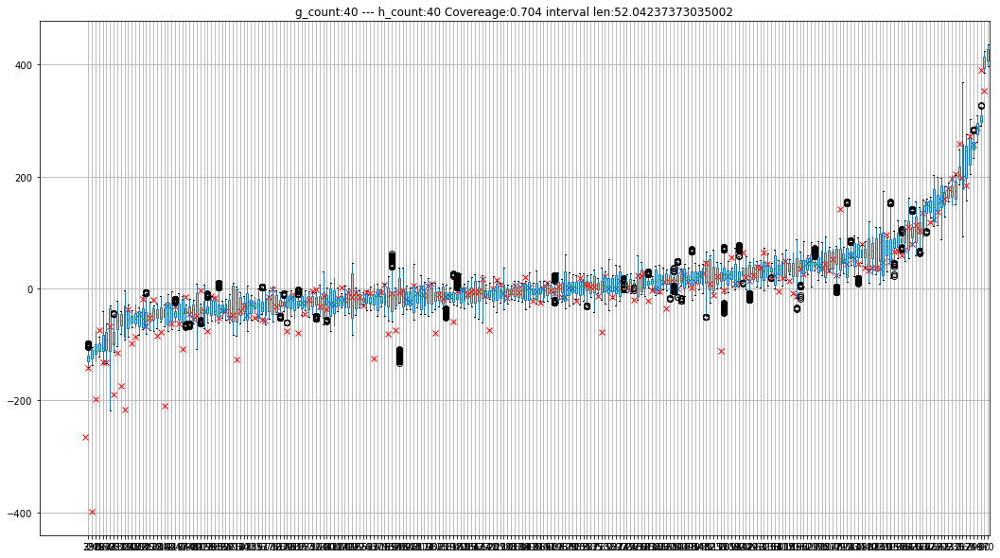

tree count: 40  --- sigma a: 5.0  --- sigma q: 0.99


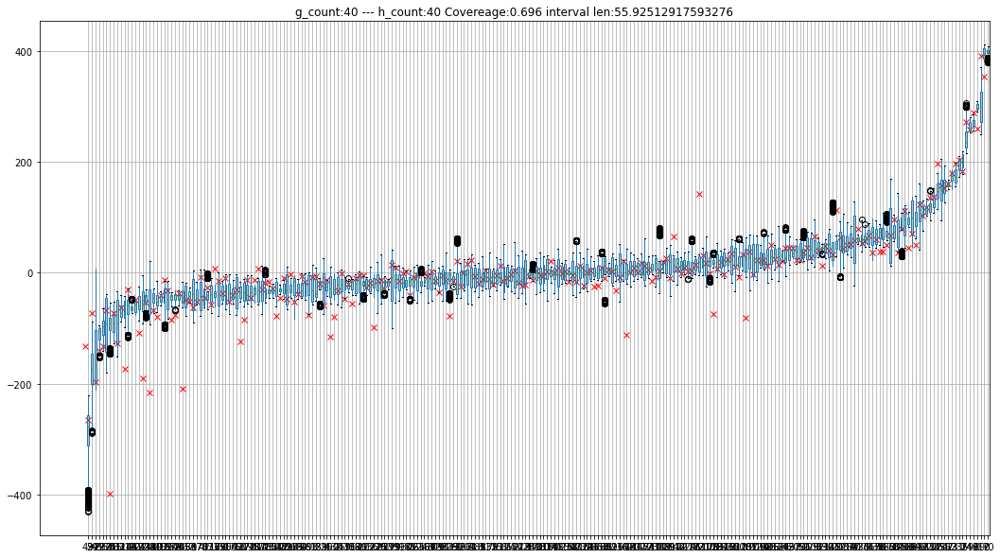

tree count: 40  --- sigma a: 10.0  --- sigma q: 0.5


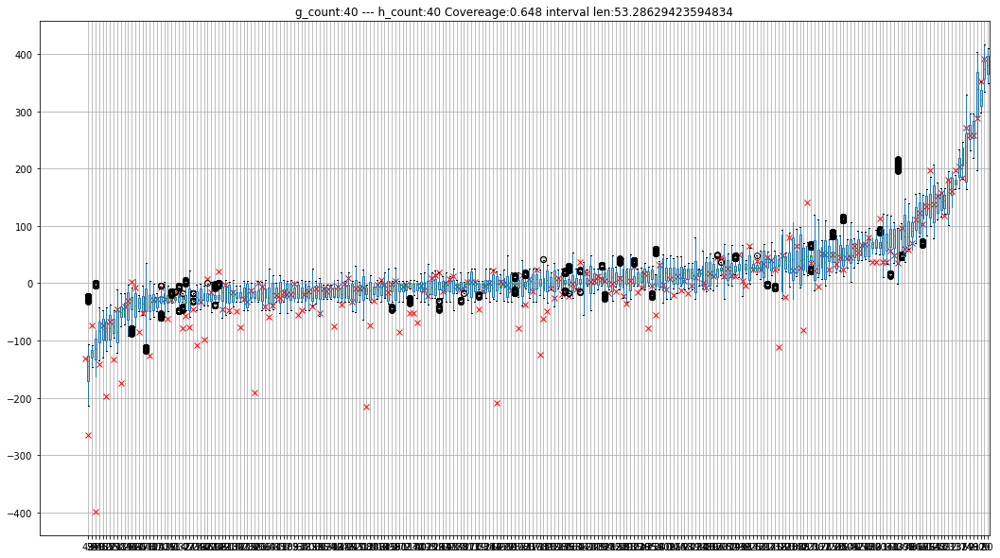

tree count: 40  --- sigma a: 10.0  --- sigma q: 0.75


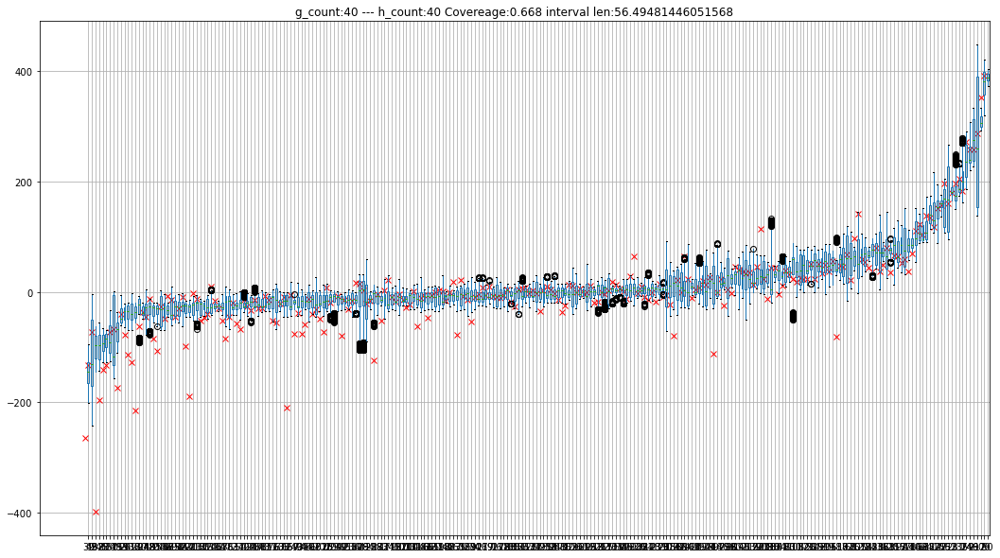

tree count: 40  --- sigma a: 10.0  --- sigma q: 0.9


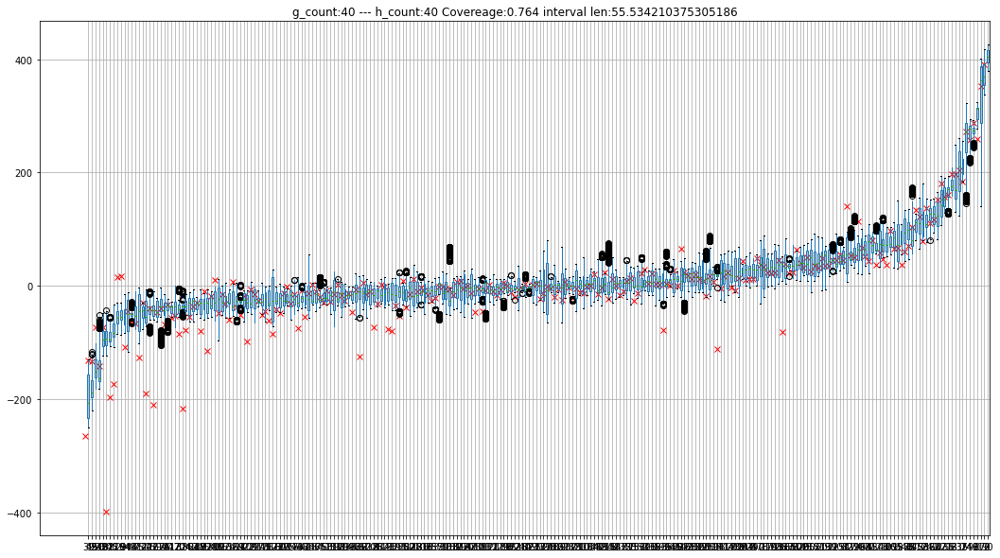

tree count: 40  --- sigma a: 10.0  --- sigma q: 0.99


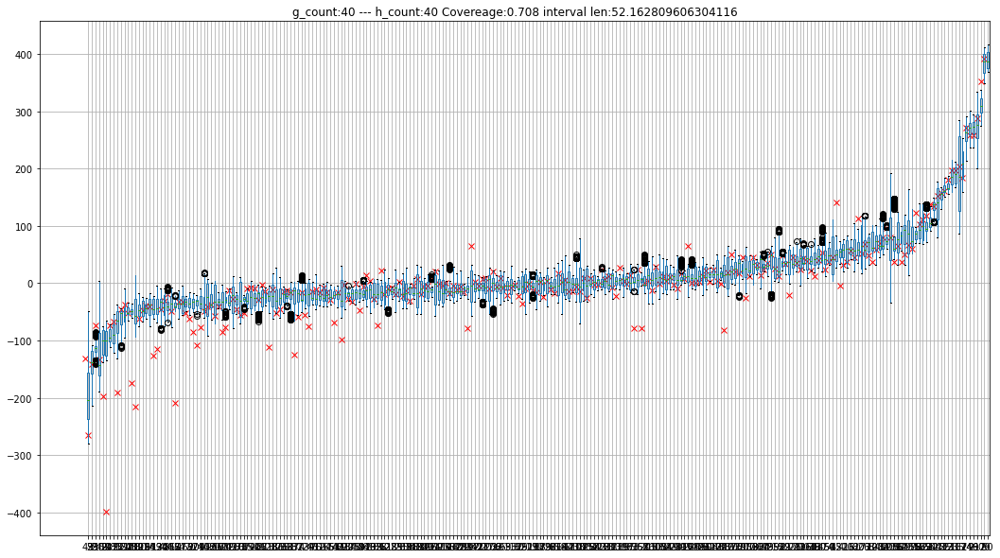

tree count: 50  --- sigma a: 3.0  --- sigma q: 0.5


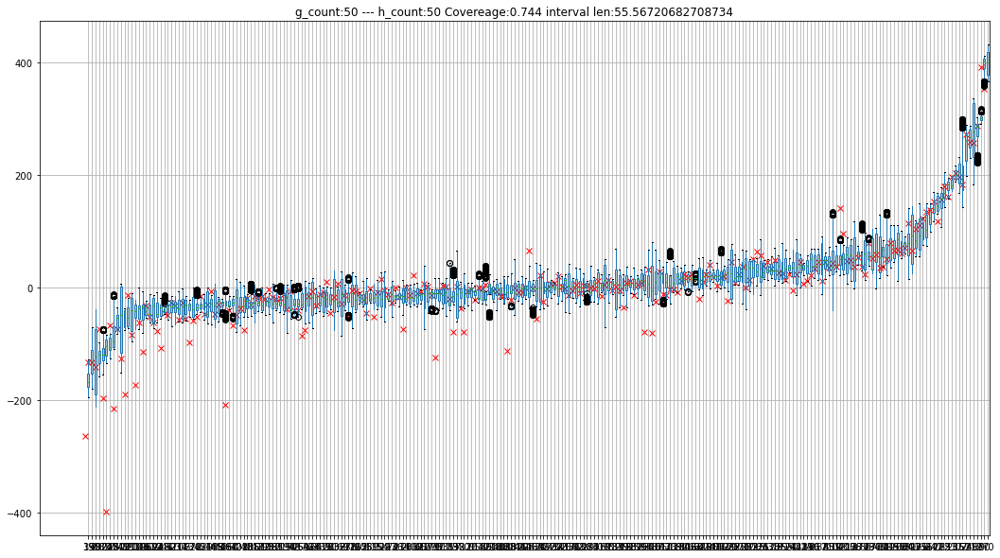

tree count: 50  --- sigma a: 3.0  --- sigma q: 0.75


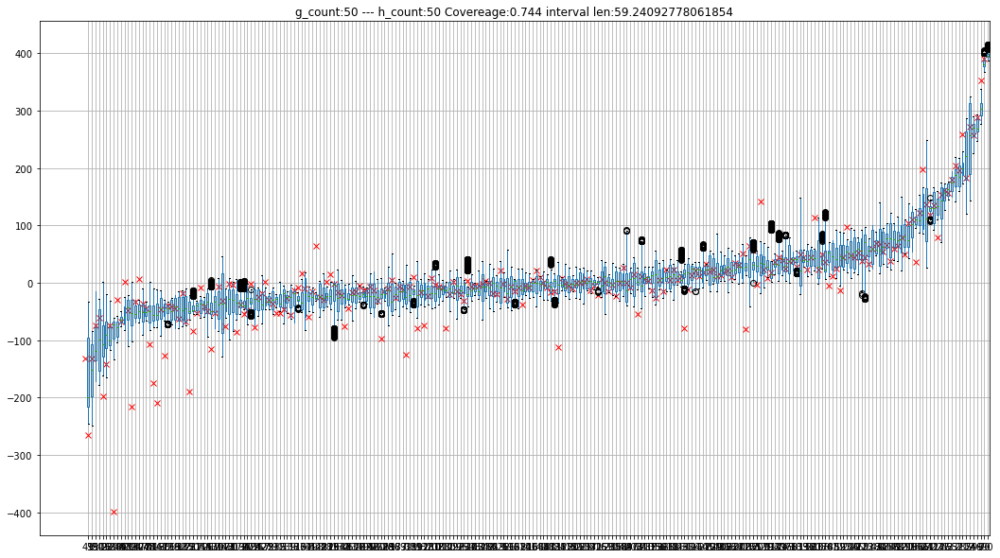

tree count: 50  --- sigma a: 3.0  --- sigma q: 0.9


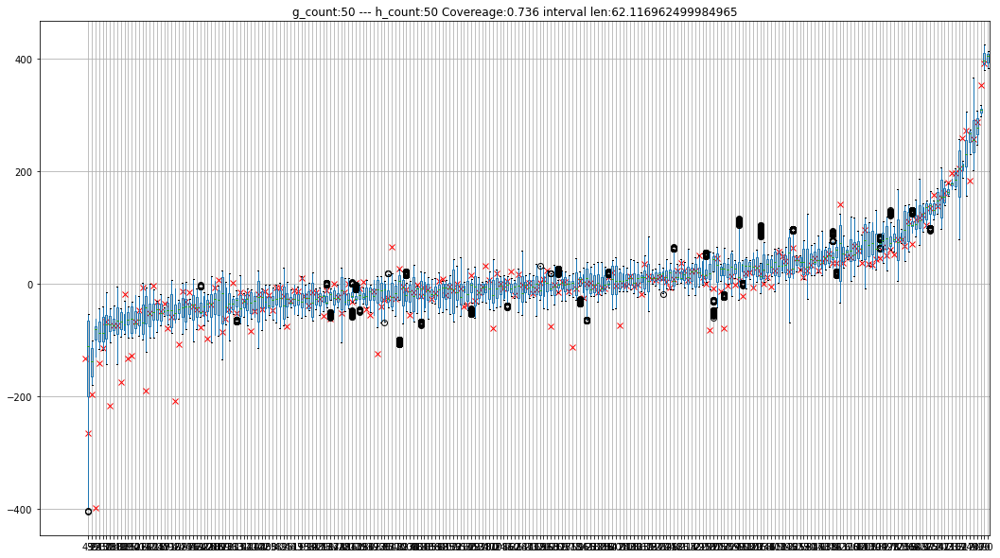

tree count: 50  --- sigma a: 3.0  --- sigma q: 0.99


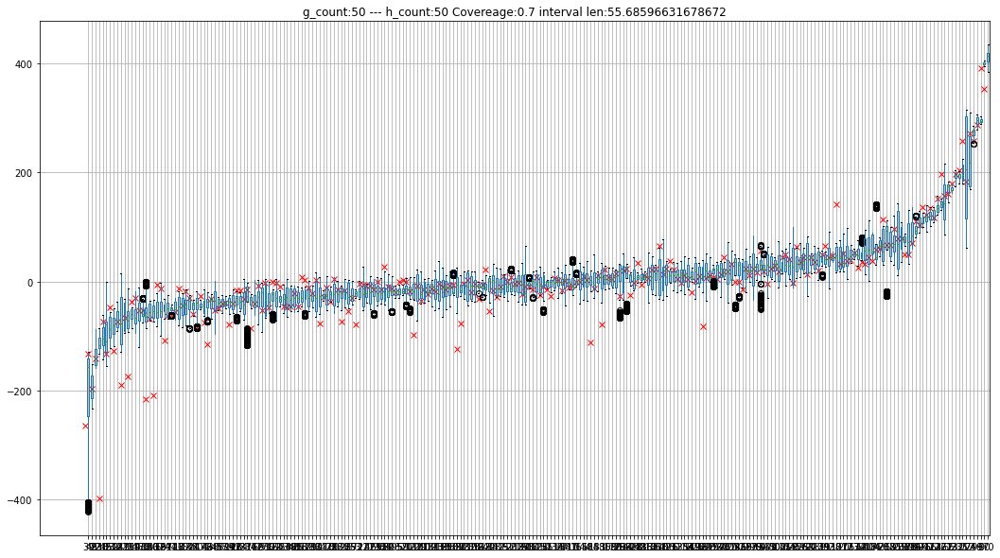

tree count: 50  --- sigma a: 5.0  --- sigma q: 0.5


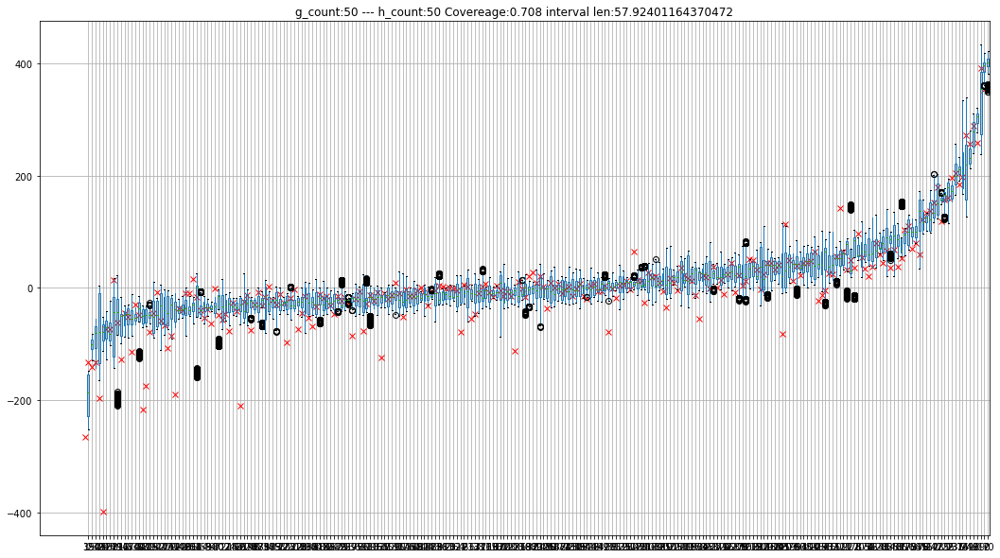

tree count: 50  --- sigma a: 5.0  --- sigma q: 0.75


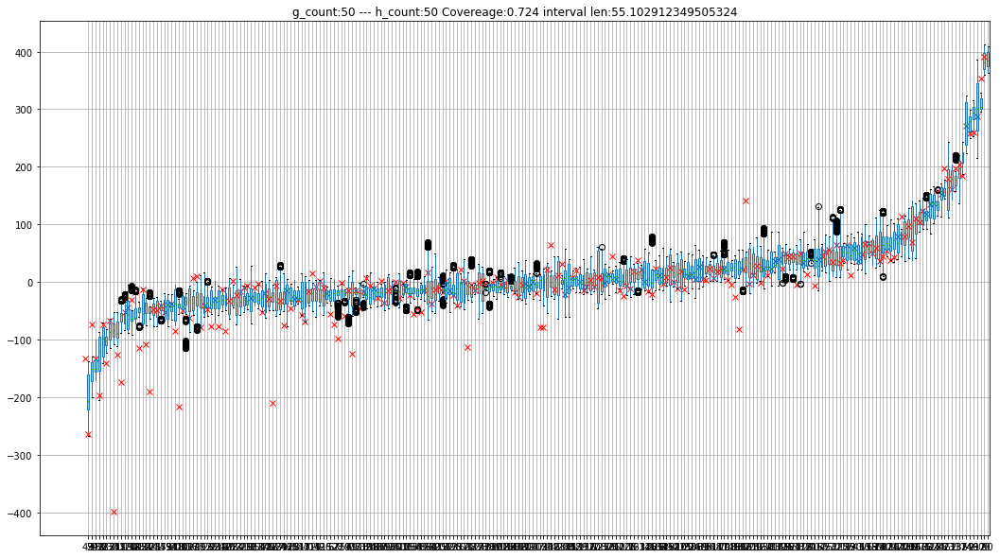

tree count: 50  --- sigma a: 5.0  --- sigma q: 0.9


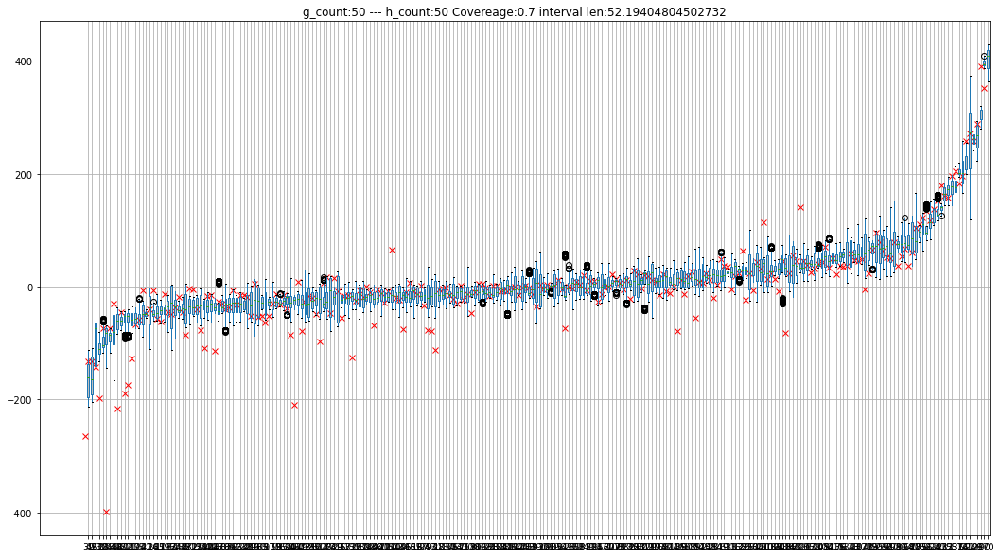

tree count: 50  --- sigma a: 5.0  --- sigma q: 0.99


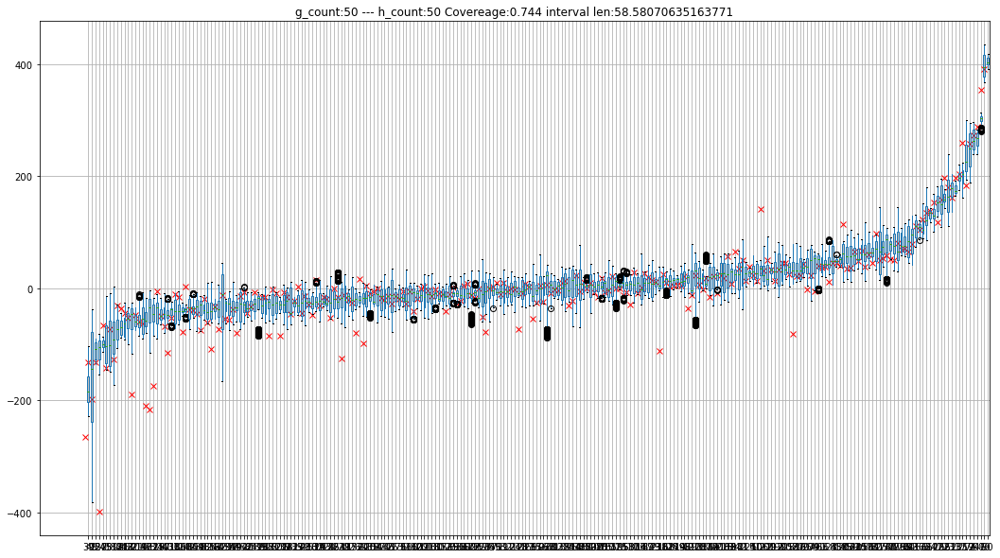

tree count: 50  --- sigma a: 10.0  --- sigma q: 0.5


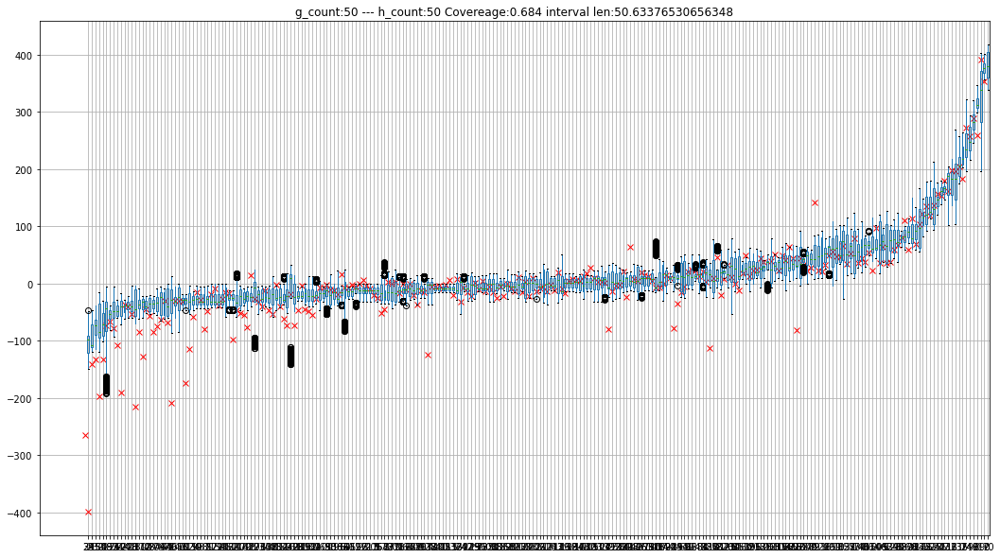

tree count: 50  --- sigma a: 10.0  --- sigma q: 0.75


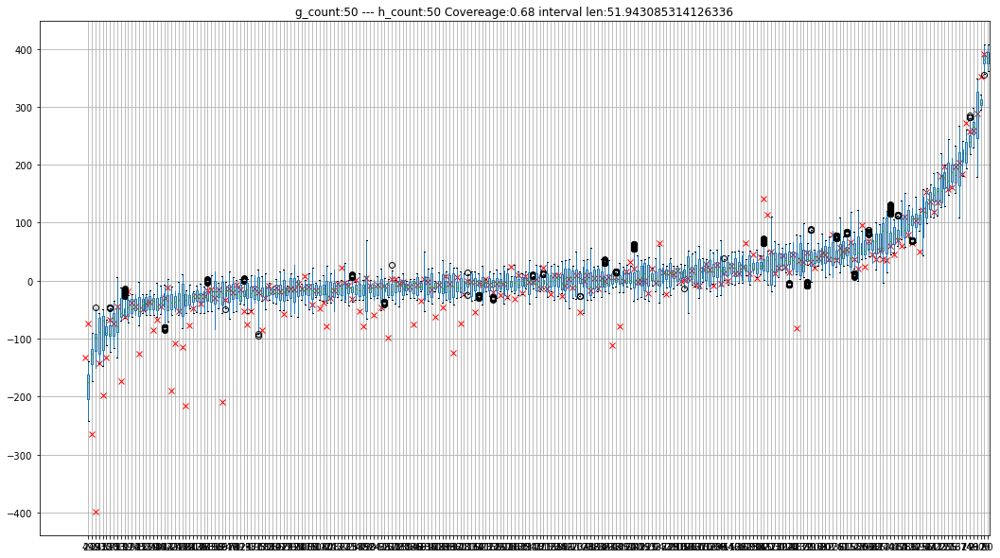

tree count: 50  --- sigma a: 10.0  --- sigma q: 0.9


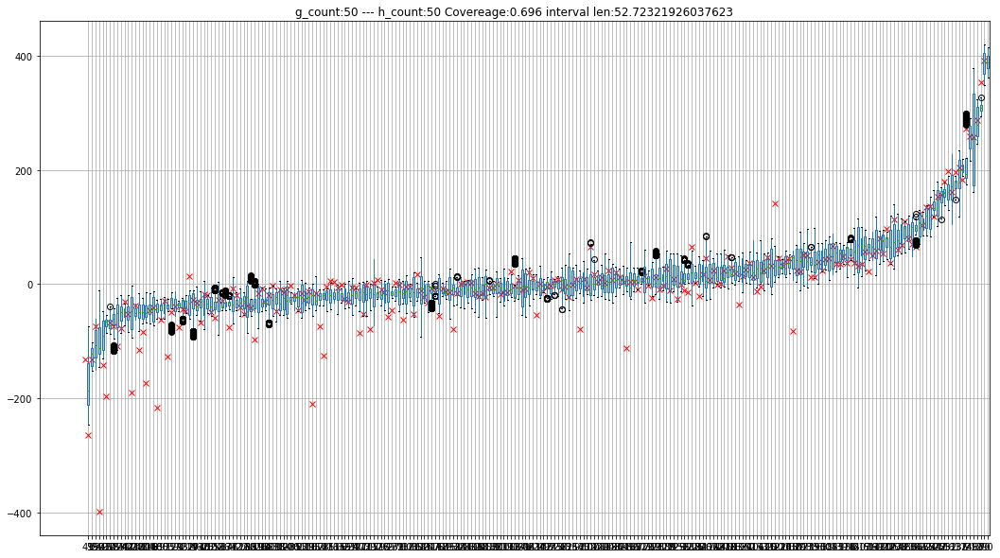

tree count: 50  --- sigma a: 10.0  --- sigma q: 0.99


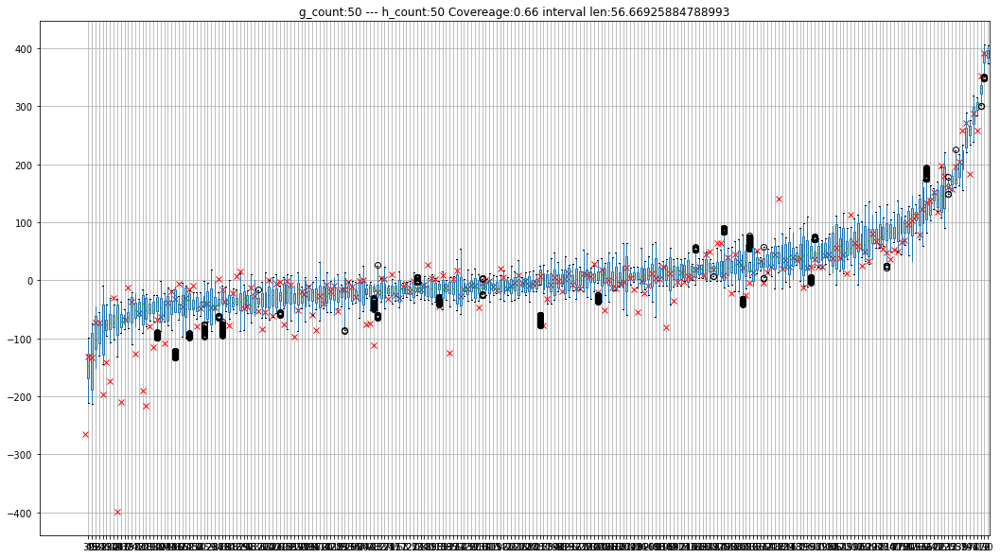

tree count: 100  --- sigma a: 3.0  --- sigma q: 0.5


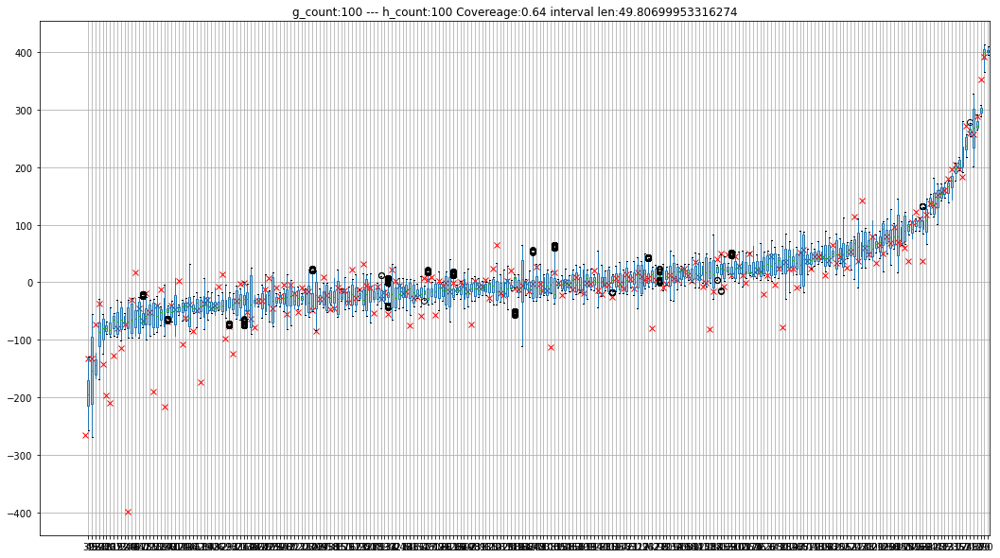

tree count: 100  --- sigma a: 3.0  --- sigma q: 0.75


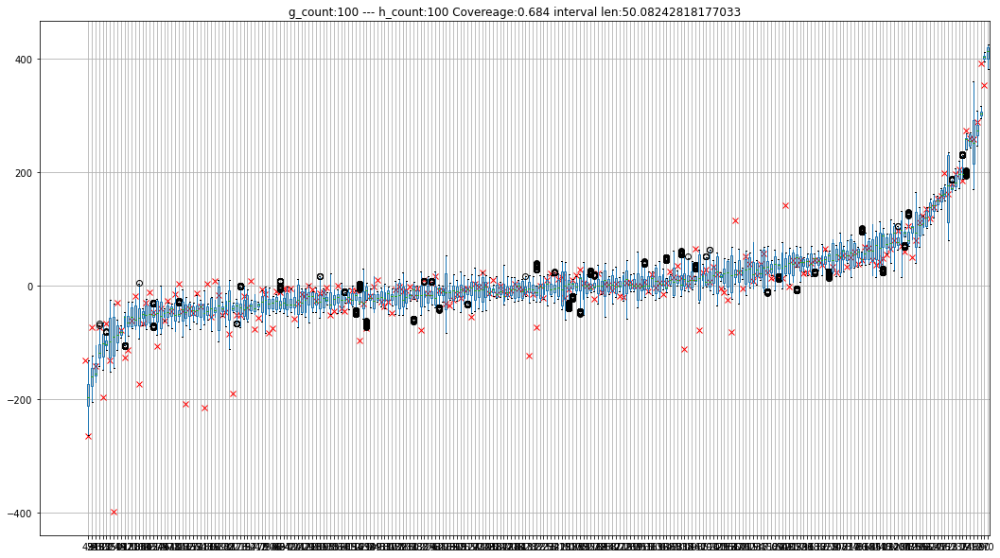

tree count: 100  --- sigma a: 3.0  --- sigma q: 0.9


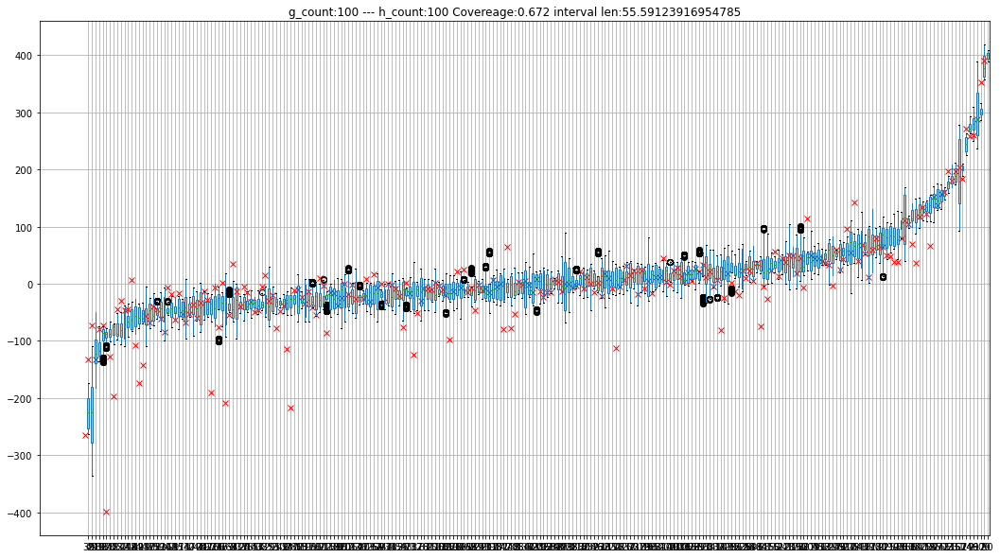

tree count: 100  --- sigma a: 3.0  --- sigma q: 0.99


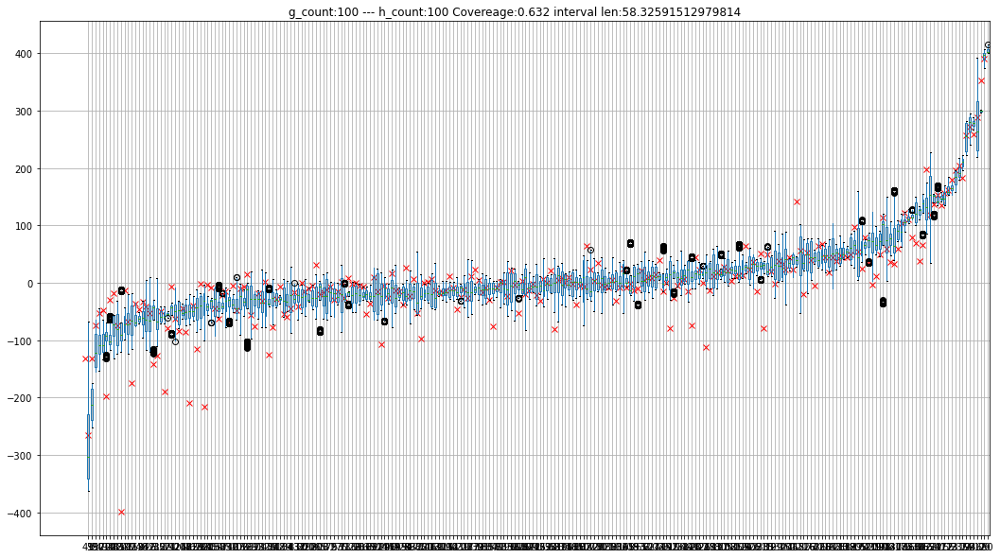

tree count: 100  --- sigma a: 5.0  --- sigma q: 0.5


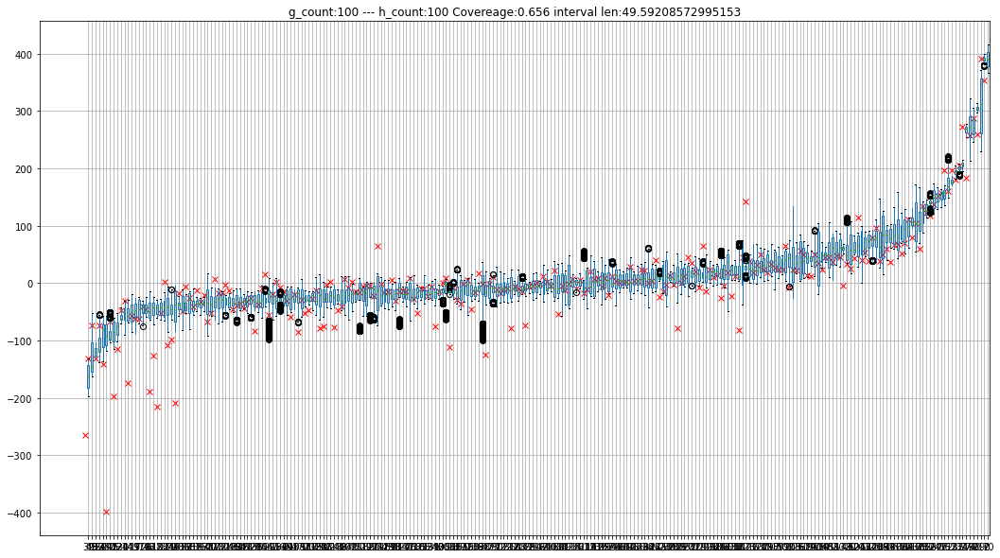

tree count: 100  --- sigma a: 5.0  --- sigma q: 0.75


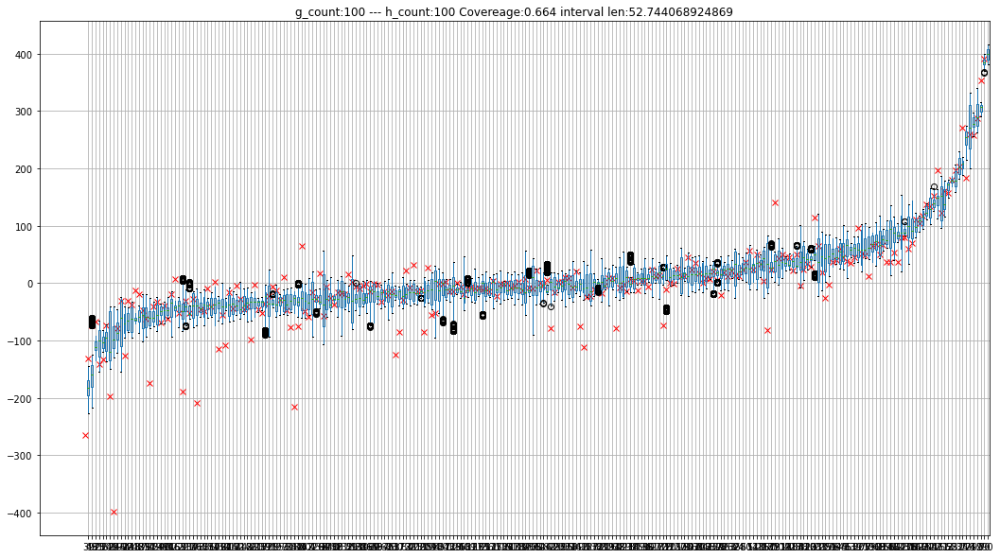

tree count: 100  --- sigma a: 5.0  --- sigma q: 0.9


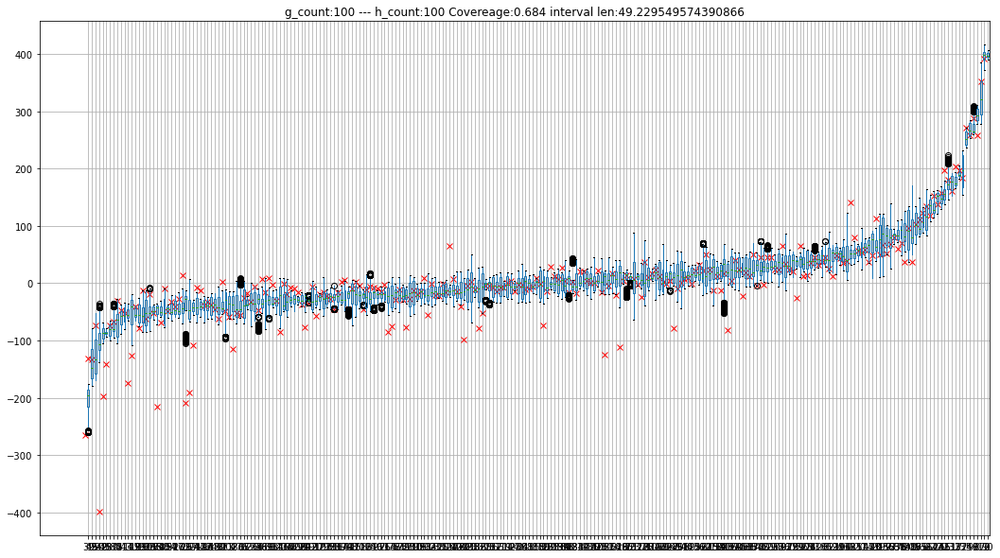

tree count: 100  --- sigma a: 5.0  --- sigma q: 0.99


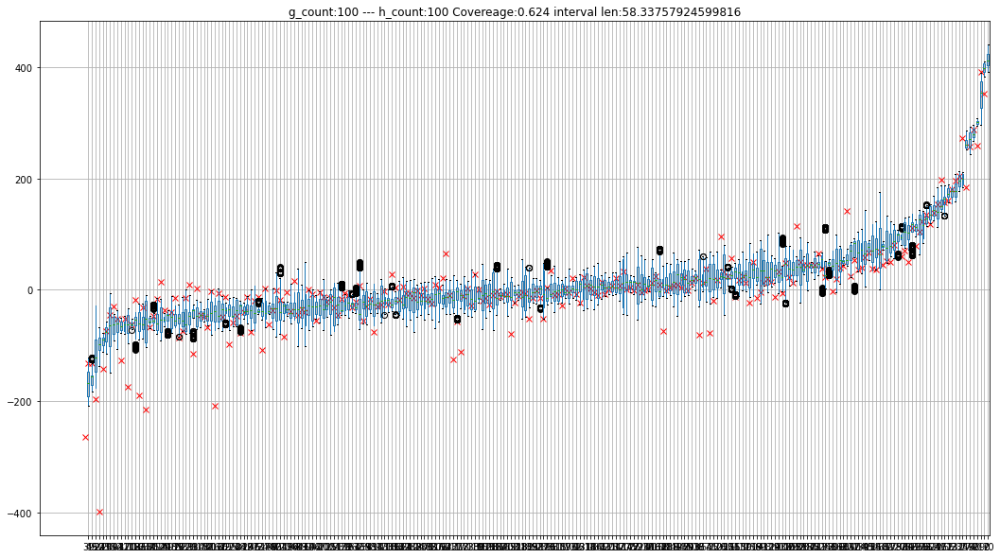

tree count: 100  --- sigma a: 10.0  --- sigma q: 0.5


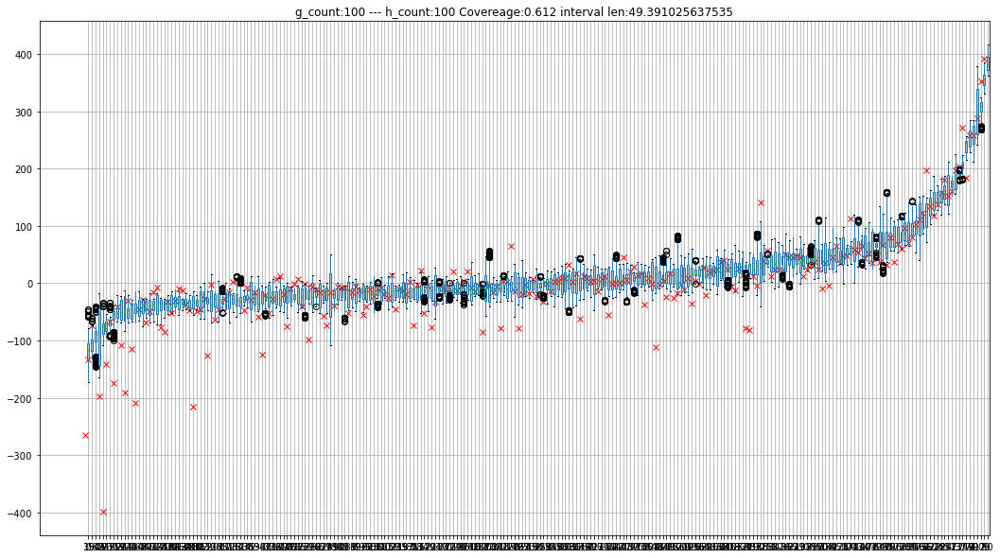

tree count: 100  --- sigma a: 10.0  --- sigma q: 0.75


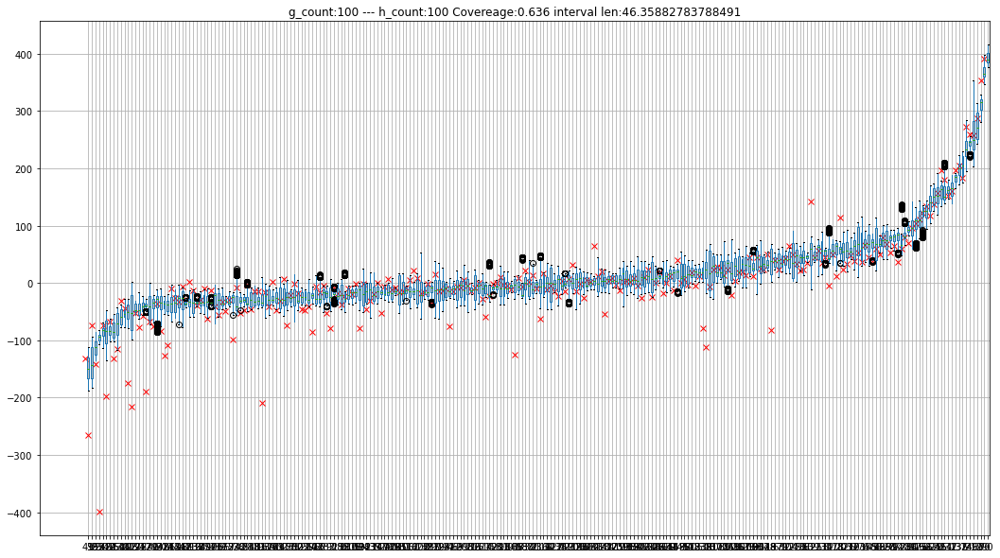

tree count: 100  --- sigma a: 10.0  --- sigma q: 0.9


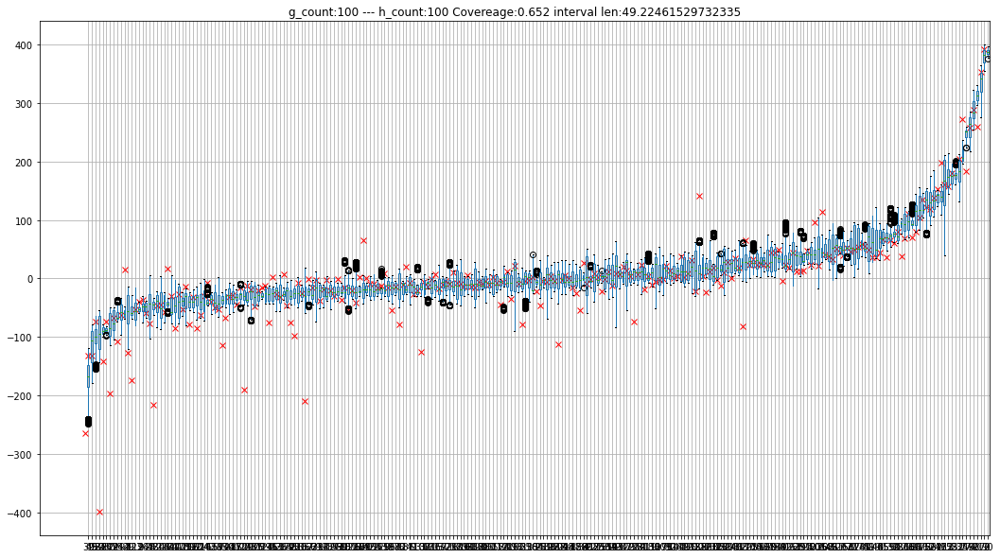

tree count: 100  --- sigma a: 10.0  --- sigma q: 0.99


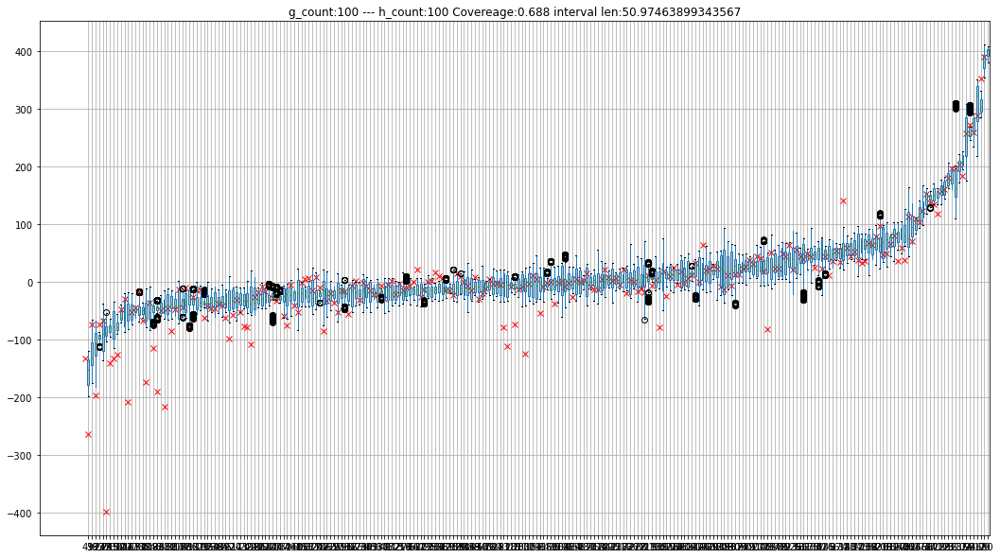

tree count: 150  --- sigma a: 3.0  --- sigma q: 0.5


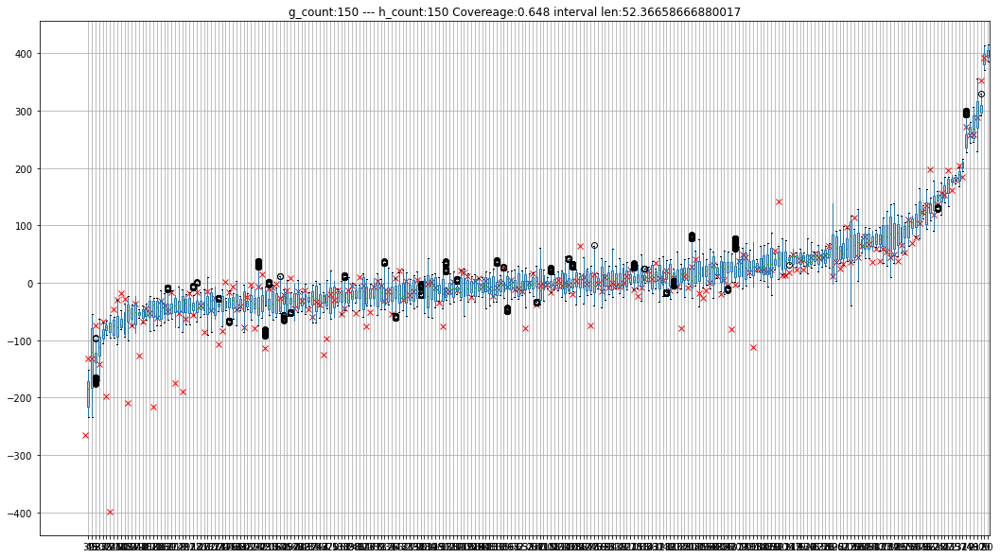

tree count: 150  --- sigma a: 3.0  --- sigma q: 0.75


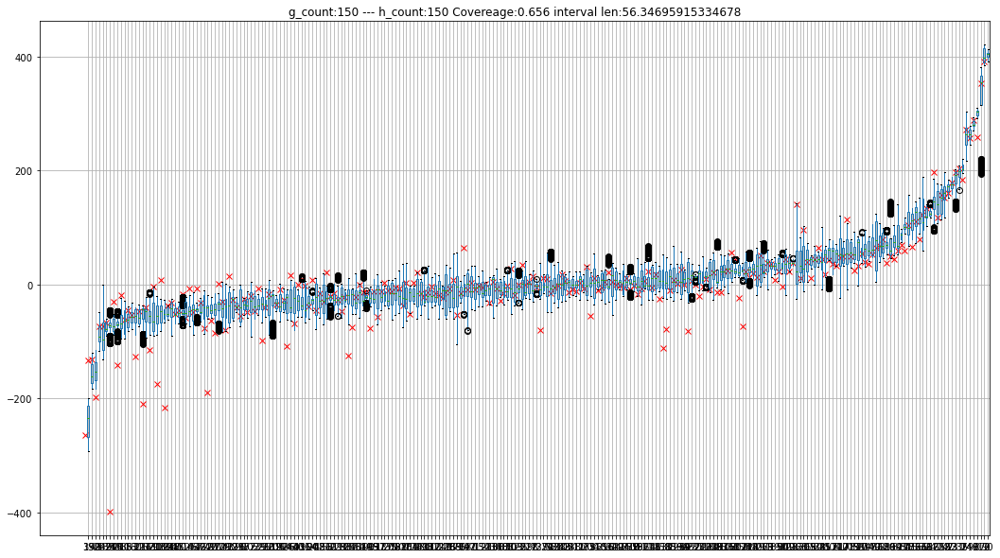

tree count: 150  --- sigma a: 3.0  --- sigma q: 0.9


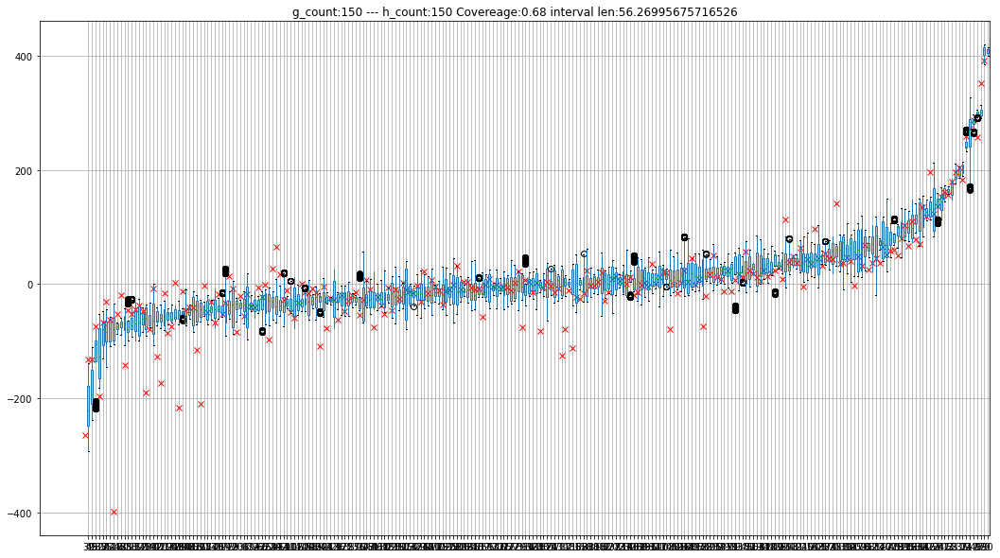

tree count: 150  --- sigma a: 3.0  --- sigma q: 0.99


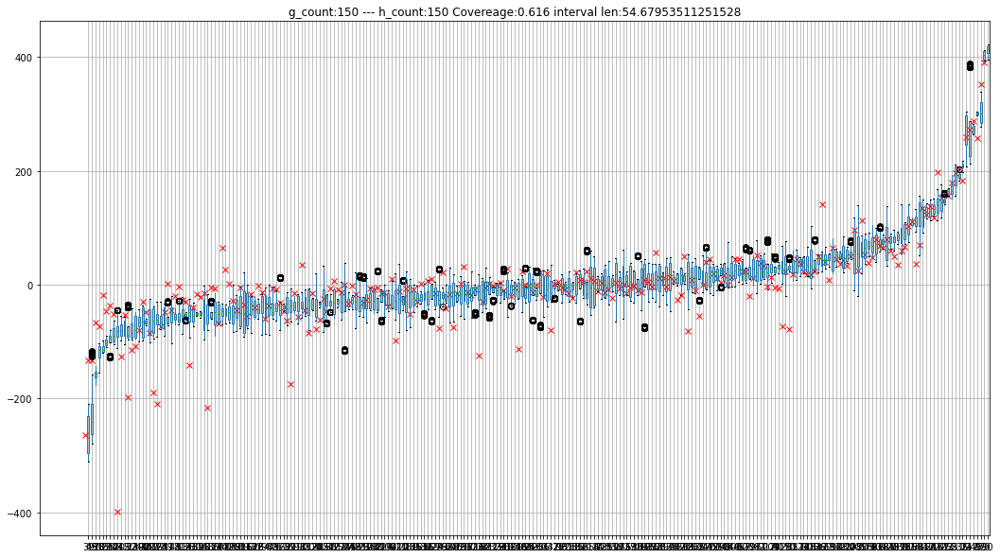

tree count: 150  --- sigma a: 5.0  --- sigma q: 0.5


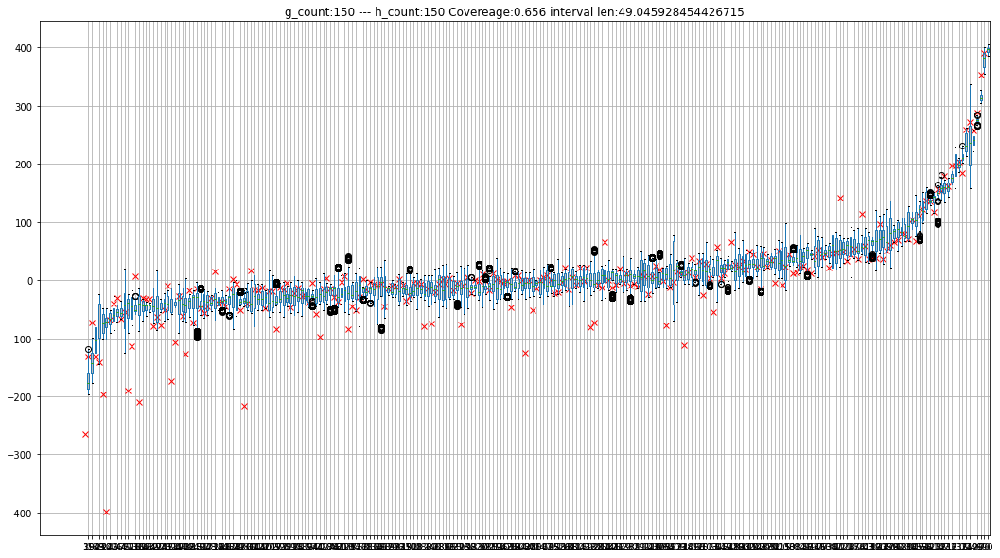

tree count: 150  --- sigma a: 5.0  --- sigma q: 0.75


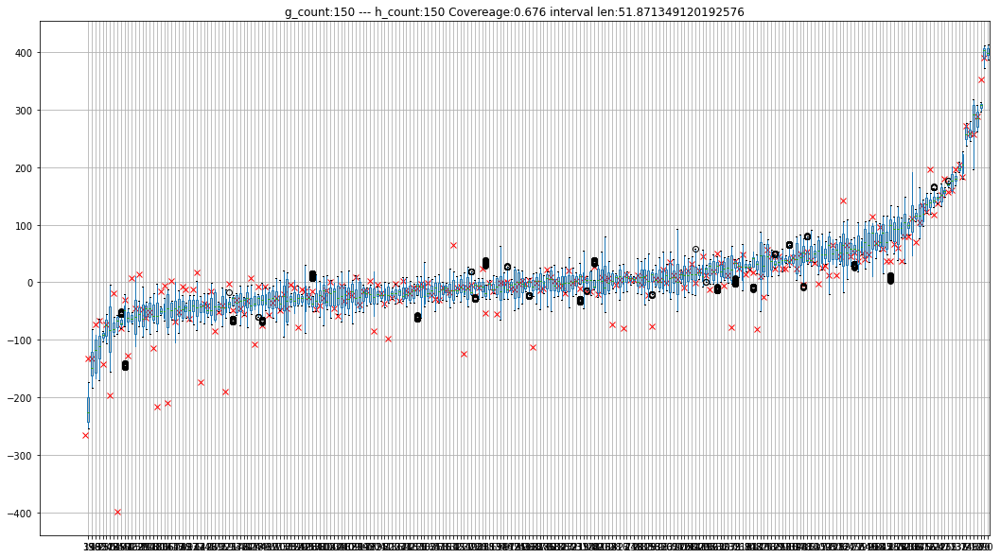

tree count: 150  --- sigma a: 5.0  --- sigma q: 0.9


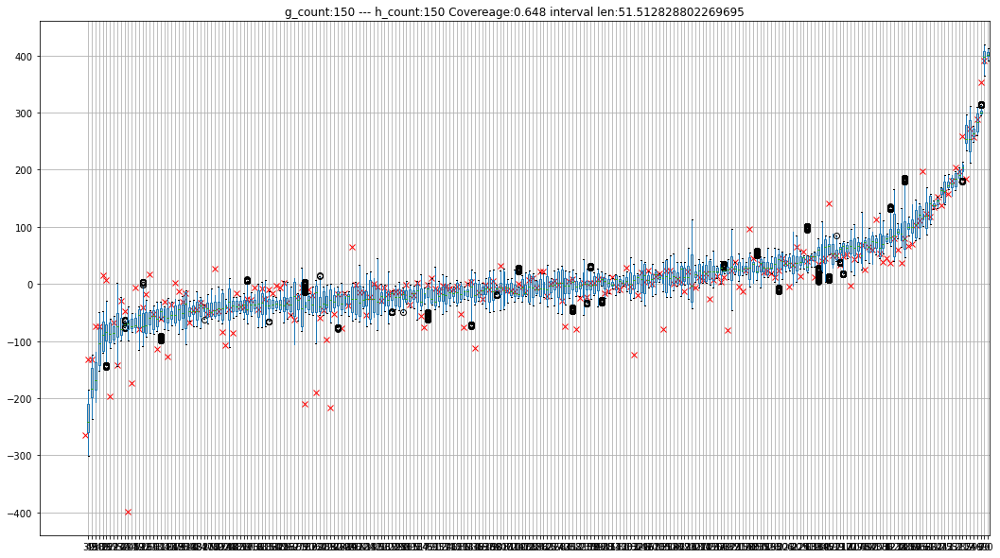

tree count: 150  --- sigma a: 5.0  --- sigma q: 0.99


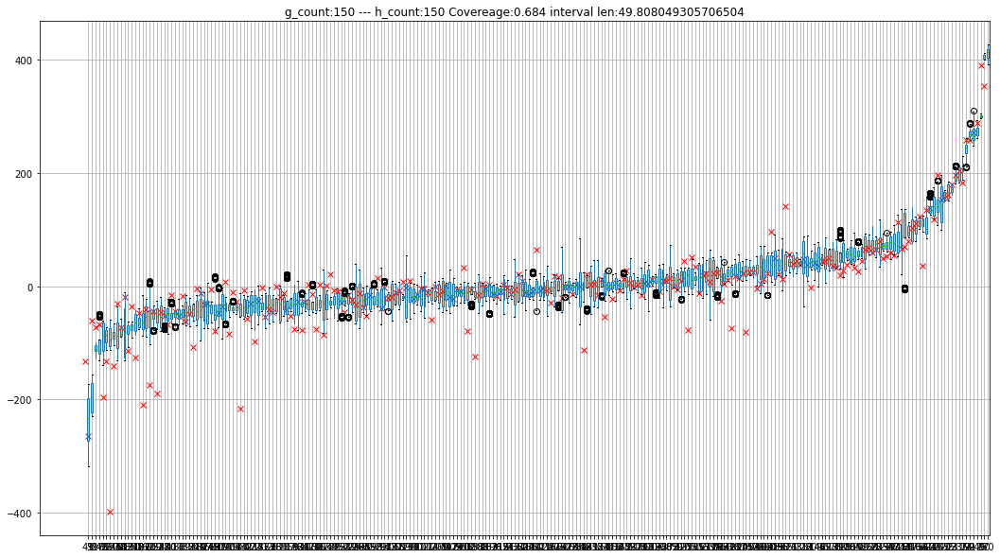

tree count: 150  --- sigma a: 10.0  --- sigma q: 0.5


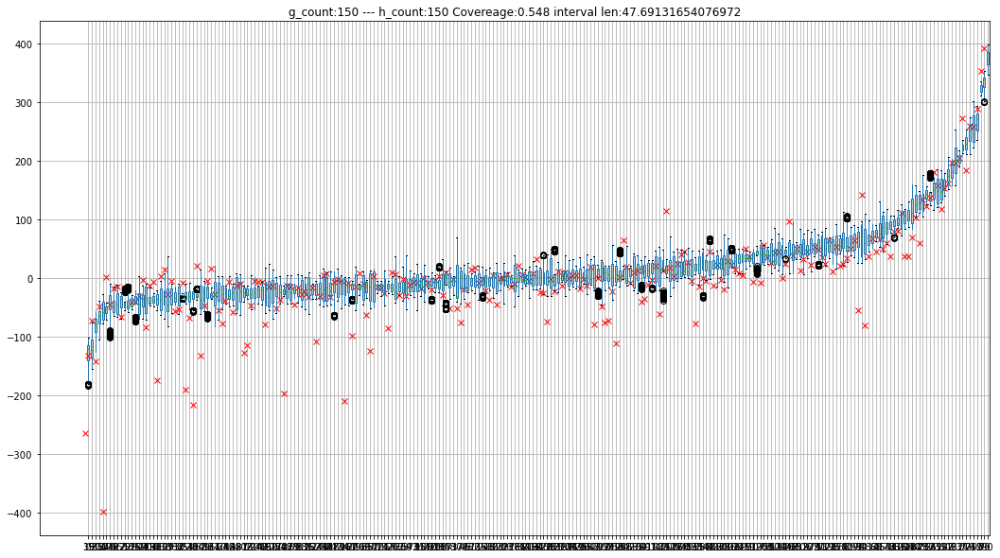

tree count: 150  --- sigma a: 10.0  --- sigma q: 0.75


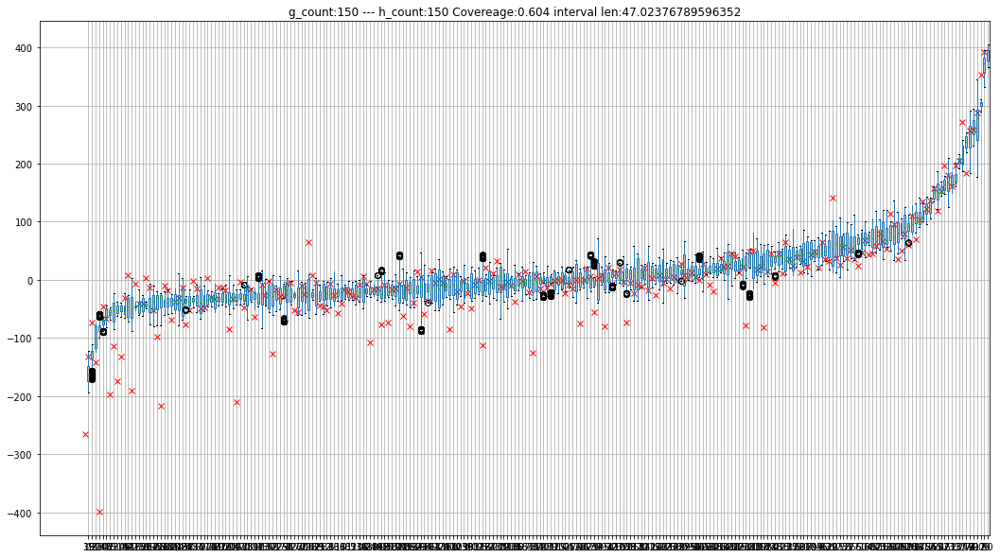

tree count: 150  --- sigma a: 10.0  --- sigma q: 0.9


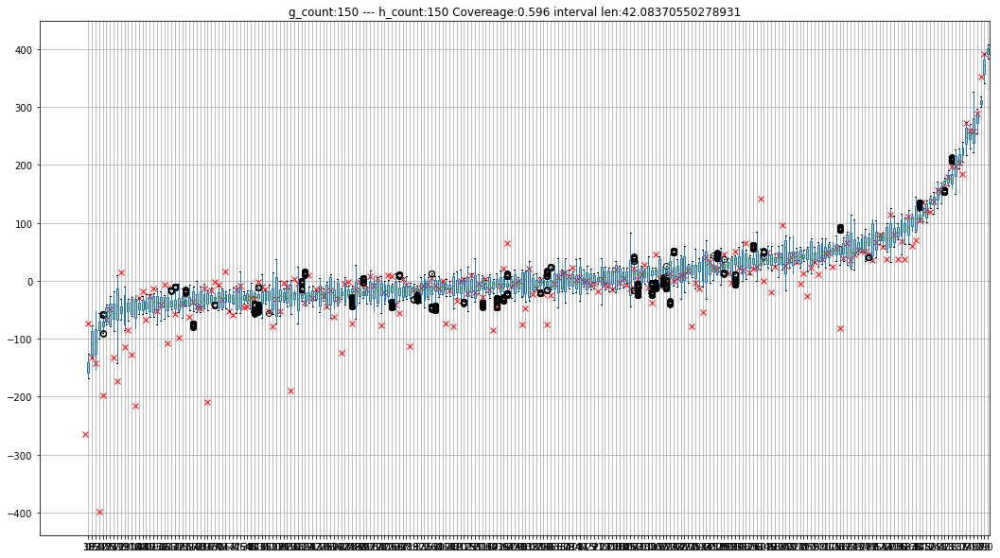

tree count: 150  --- sigma a: 10.0  --- sigma q: 0.99


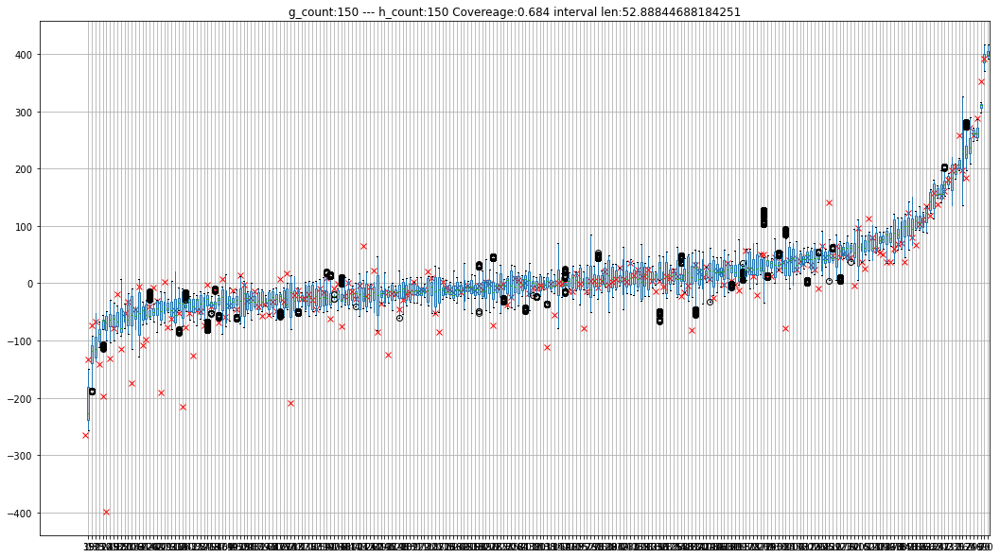

tree count: 200  --- sigma a: 3.0  --- sigma q: 0.5


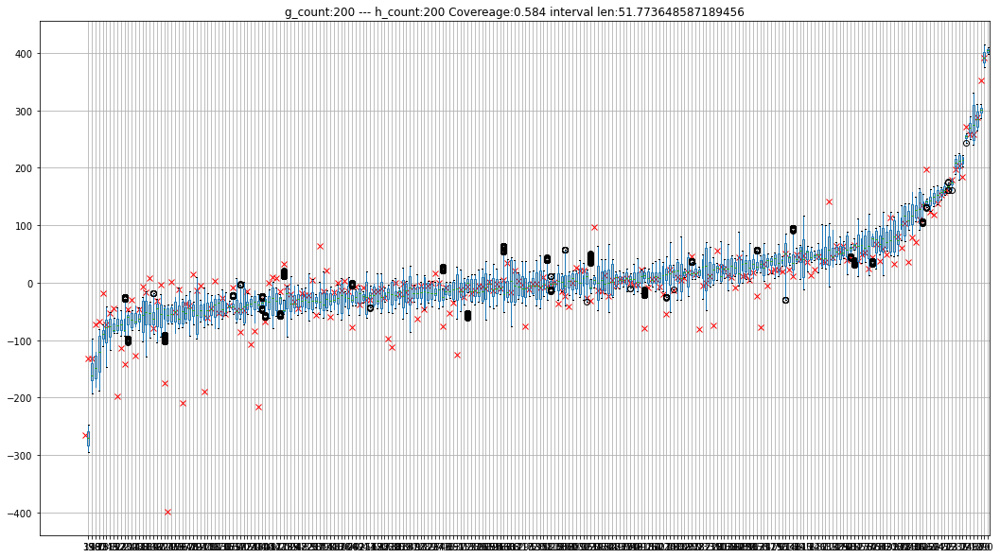

tree count: 200  --- sigma a: 3.0  --- sigma q: 0.75


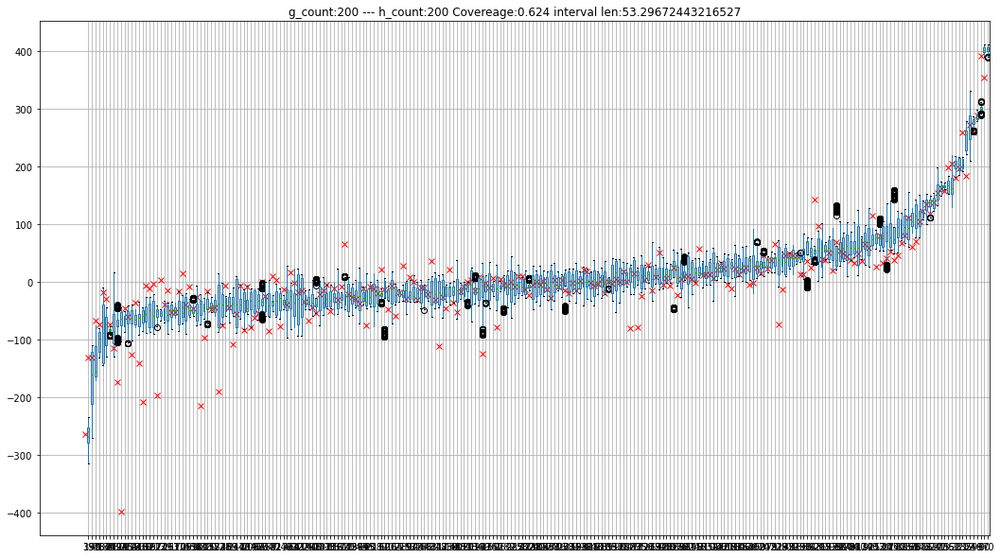

tree count: 200  --- sigma a: 3.0  --- sigma q: 0.9


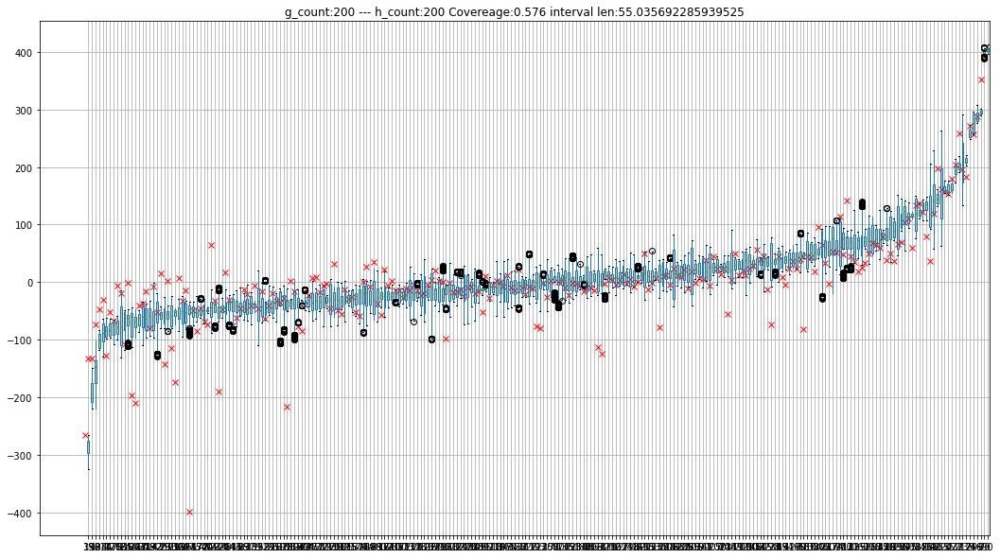

tree count: 200  --- sigma a: 3.0  --- sigma q: 0.99


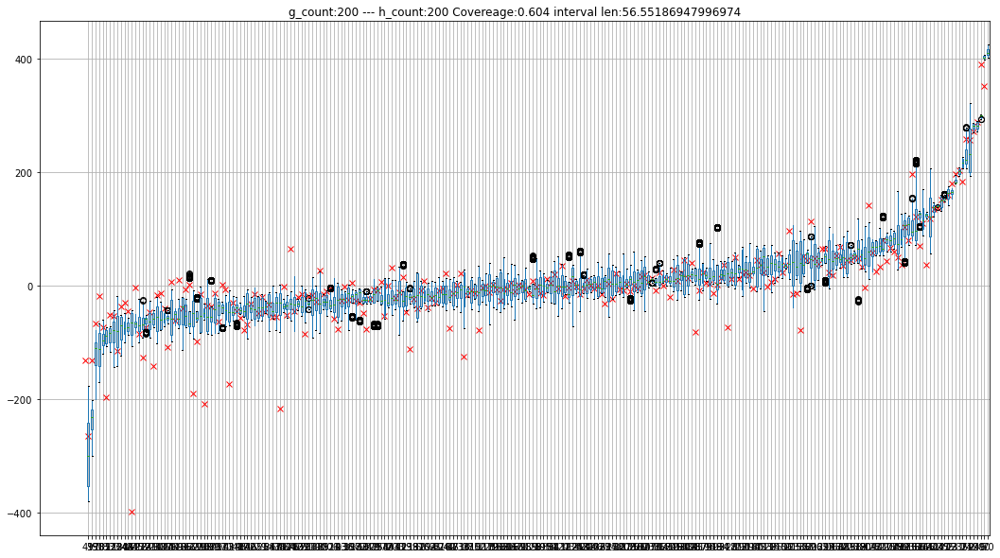

tree count: 200  --- sigma a: 5.0  --- sigma q: 0.5


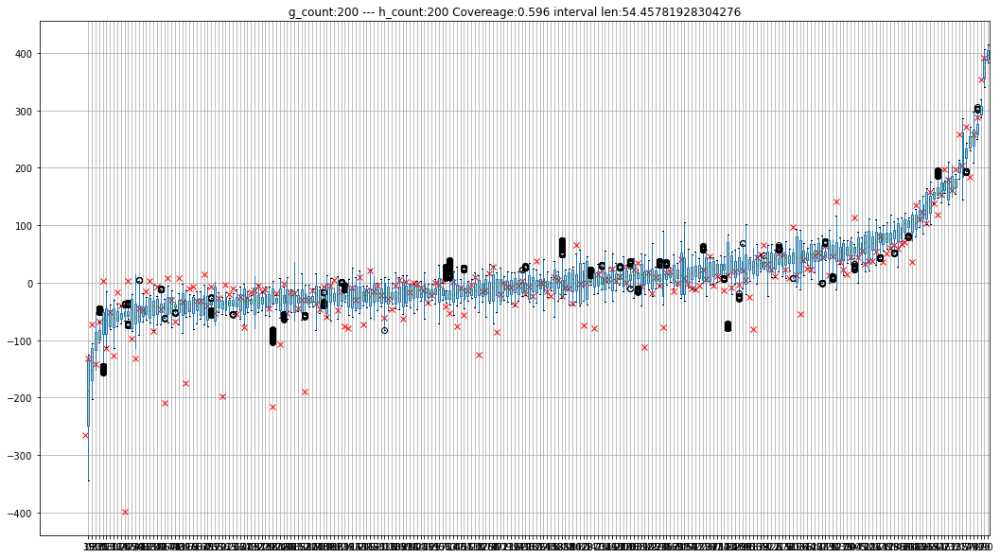

tree count: 200  --- sigma a: 5.0  --- sigma q: 0.75


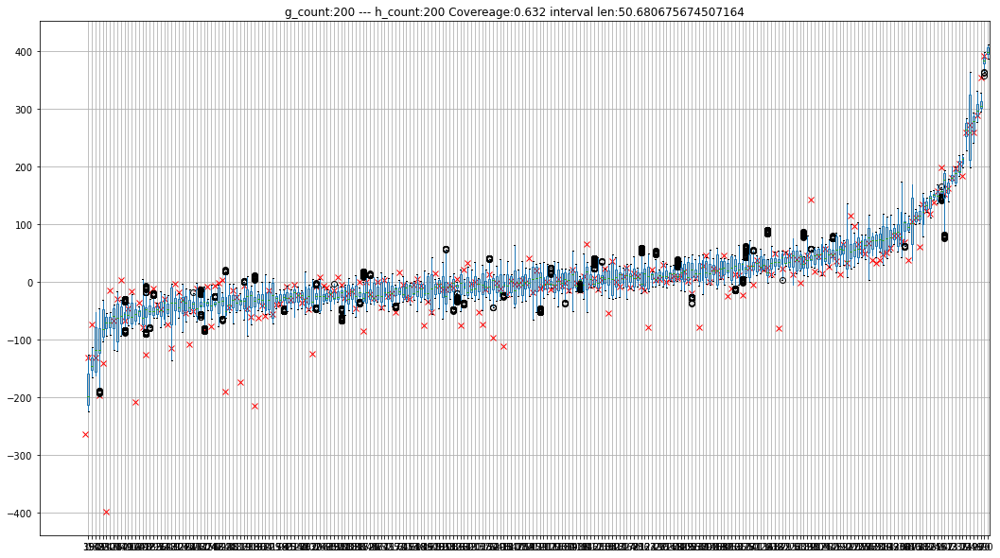

tree count: 200  --- sigma a: 5.0  --- sigma q: 0.9


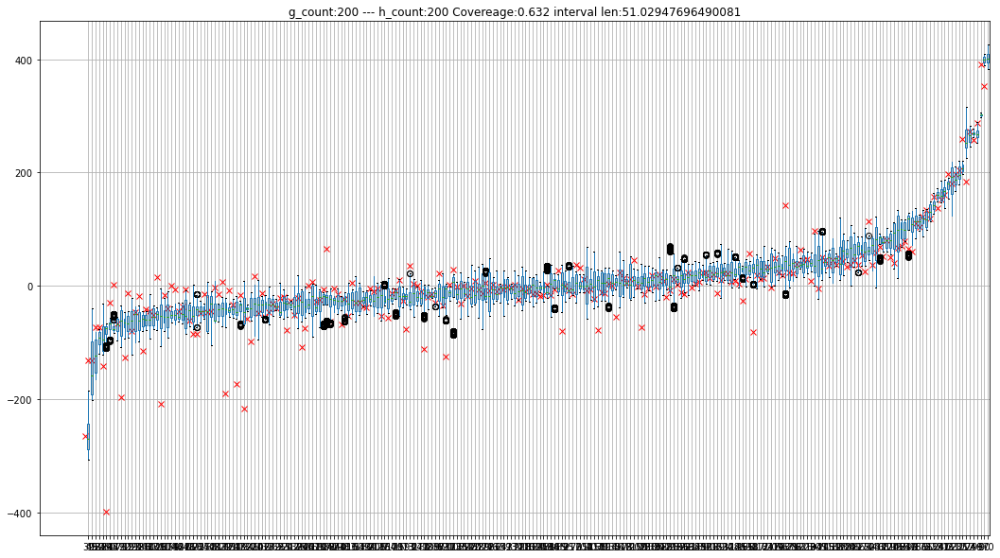

tree count: 200  --- sigma a: 5.0  --- sigma q: 0.99


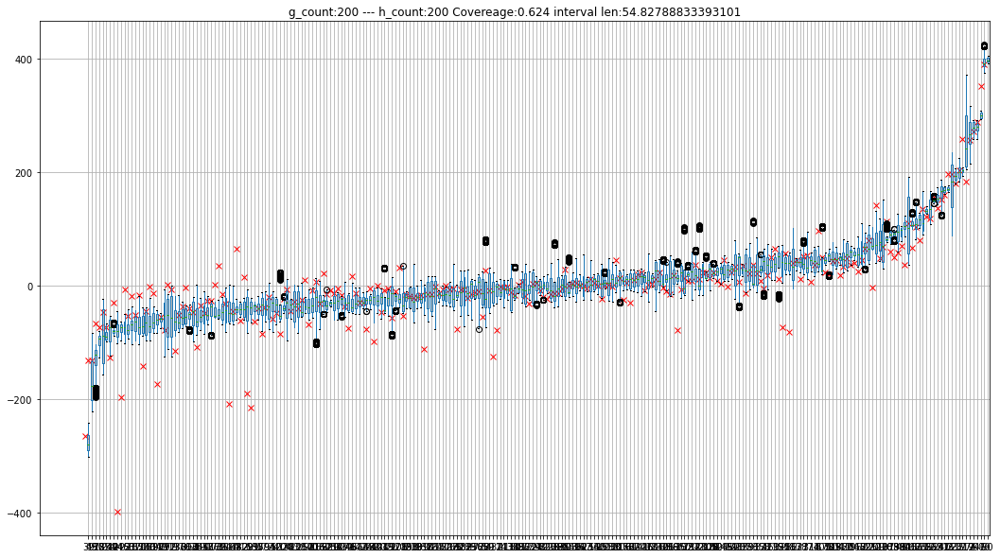

tree count: 200  --- sigma a: 10.0  --- sigma q: 0.5


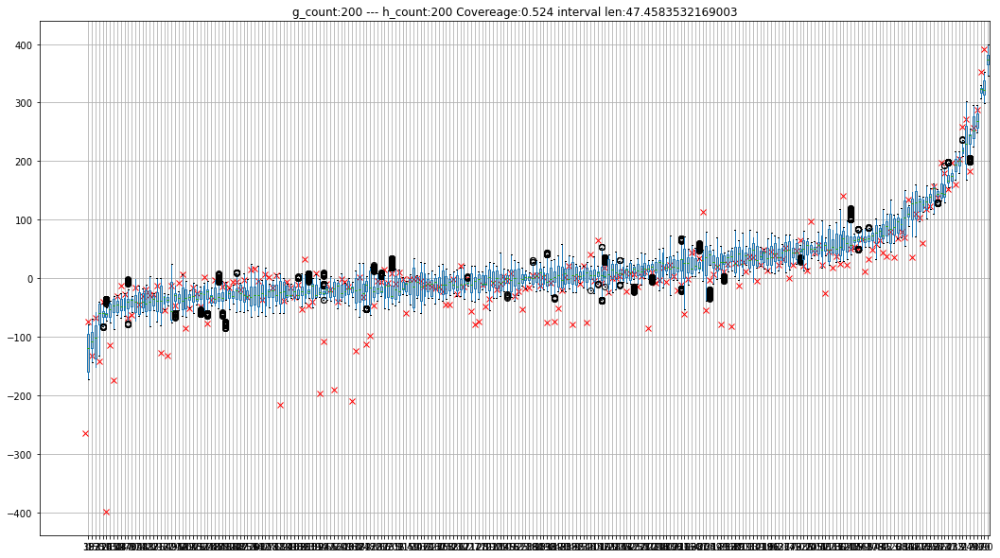

tree count: 200  --- sigma a: 10.0  --- sigma q: 0.75


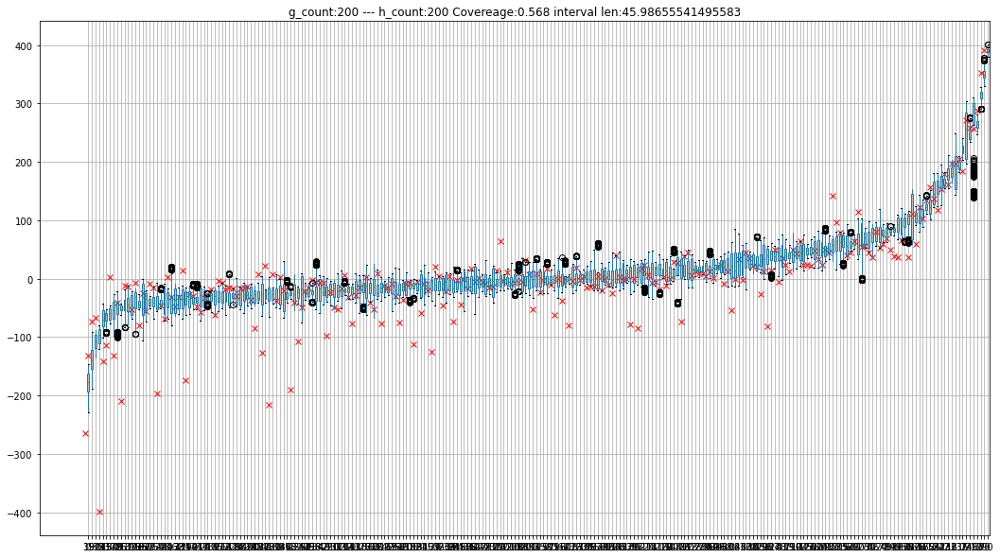

tree count: 200  --- sigma a: 10.0  --- sigma q: 0.9


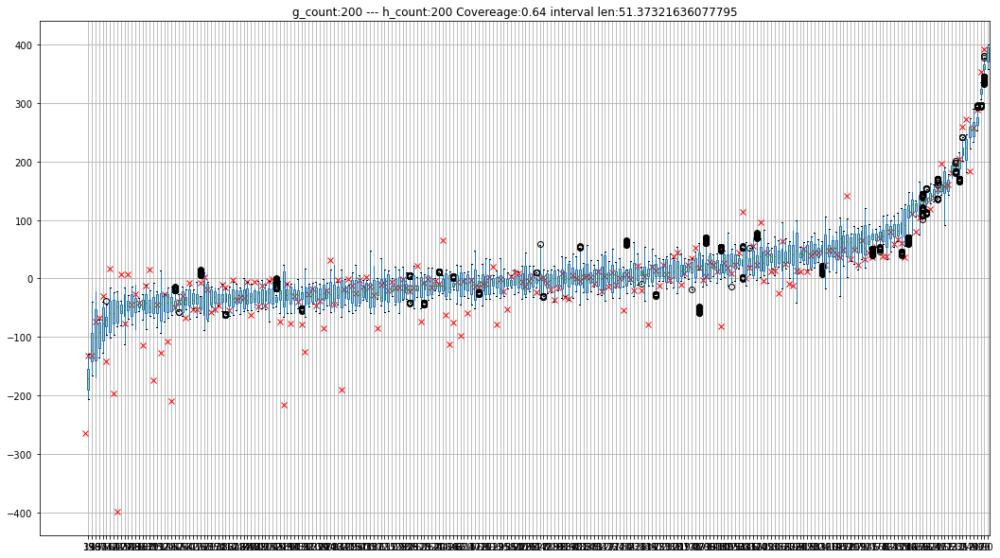

tree count: 200  --- sigma a: 10.0  --- sigma q: 0.99


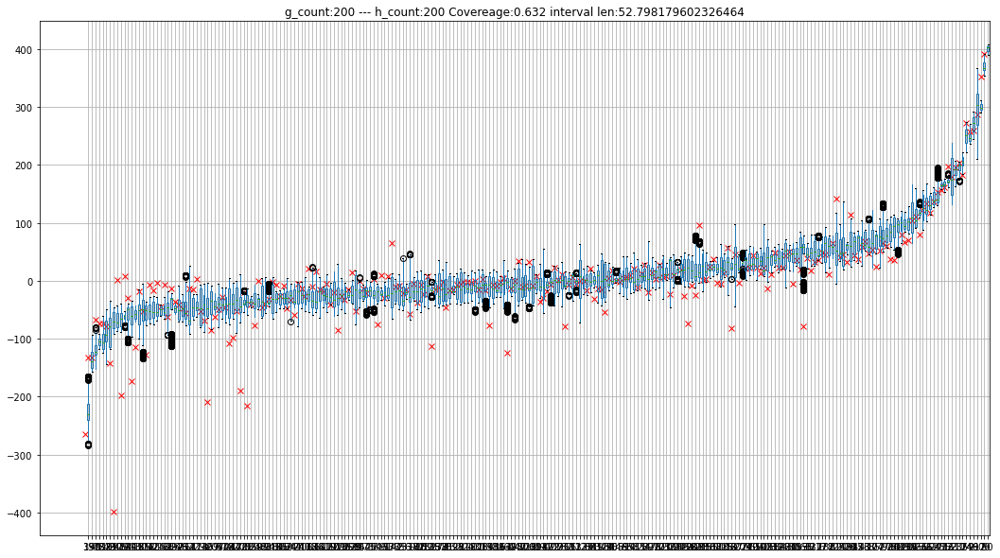

In [26]:
data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")
tau = np.array(data.tau)
Y1m0=np.array(data.Y1)-np.array(data.Y0)
for tc in tree_count:
    for sa in sigma_a_list:
        for qi in q_list:
            print("tree count:",tc,  " --- sigma a:", sa,  " --- sigma q:", qi)
            base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
            loaded_g = np.load(path + base_file_name_g)
            
            coverage_matrix=np.zeros((int(thin*n_samples)*n_chains, n))
            for i in range(n_chains):
                coverage_matrix[i*int(thin*n_samples):(i+1)*int(thin*n_samples)]=loaded_g[:,:,i,0].T
                
            q975 = np.quantile( coverage_matrix, q=0.975, axis=0)
            q025 = np.quantile( coverage_matrix, q=0.025, axis=0)
            U=np.array(tau<q975).astype(int)
            L= np.array(q025<tau).astype(int)
            
            interval_length = np.mean(q975-q025)
            
            post_samples = pd.DataFrame(coverage_matrix)
            small_to_big = (post_samples.mean(axis=0)).sort_values().index
            plt.figure(figsize=(18,10))
            _=plt.plot(tau[small_to_big], 'x', color='red')
            #_=plt.plot(Y1m0[small_to_big], '^', color='black')
            _=post_samples[small_to_big].boxplot()
            plt.title(
                "g_count:" + str(tc) +   
                " --- h_count:" + str(tc) + 
                " Covereage:" + str(sum(U*L)/n) +
                " interval len:" + str(round(interval_length, 2))
            )
            plt.show()

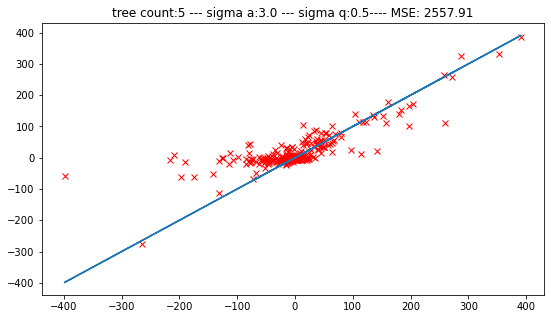

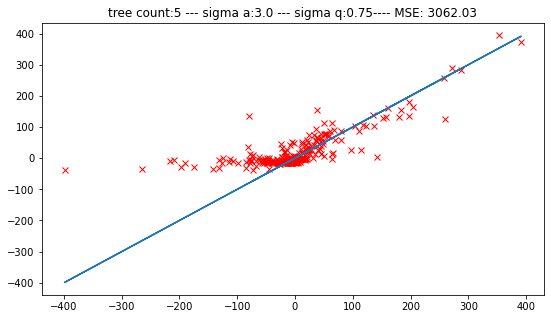

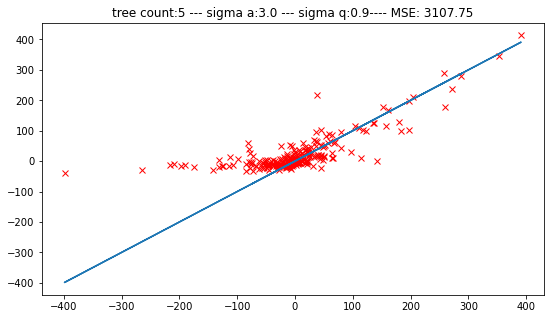

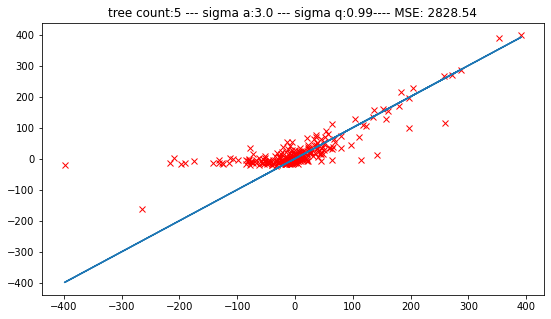

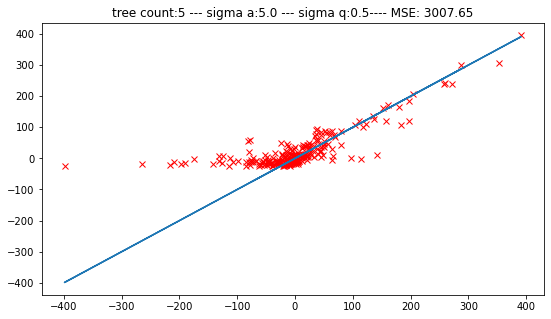

...

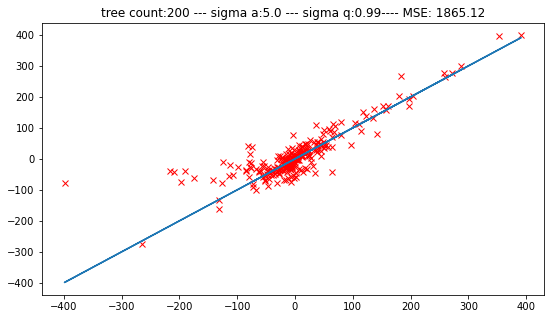

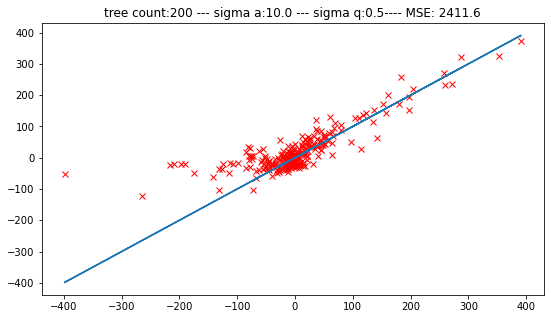

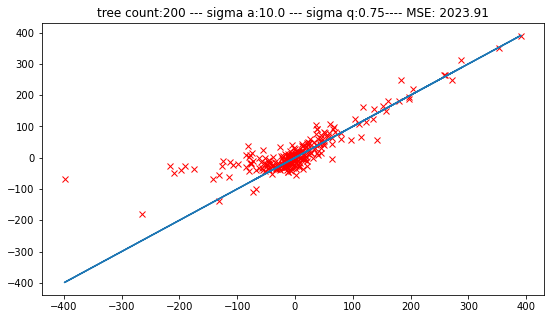

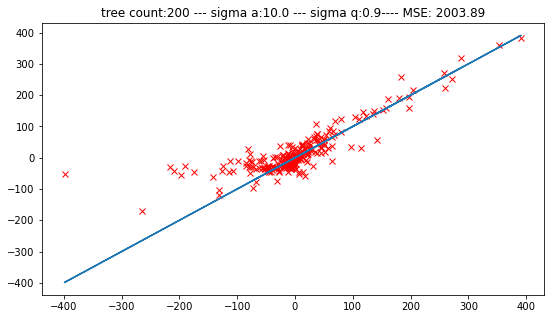

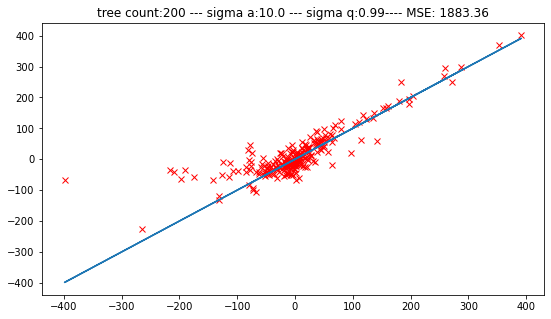

In [33]:
data = data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")
tau=data.tau
for tc in tree_count:
    for sa in sigma_a_list:
        for qi in q_list:
            #print("tree count:",tc,  " --- sigma a:", sa,  " --- sigma q:", qi)
            base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
            loaded_g = np.load(path + base_file_name_g)

            estimate = np.mean(loaded_g, axis=(1,2,3))
            MSE=np.mean((estimate-tau)**2)
            plt.figure(figsize=(9,5))
            _=plt.plot(tau,np.mean(loaded_g, axis=(1,2,3)), 'x', color='red')
            plt.plot(tau,tau)
            plt.title(
                "tree count:" + str(tc) +  
                " --- sigma a:" + str(sa) +  
                " --- sigma q:" + str(qi) + 
                "---- MSE: " + str(round(MSE,2))
            )
            plt.show()
            

In [96]:
# MSE for tree_count x sigma_a x sigma_q
tree_count = [10,30,40,50,100]
MSE_results = np.zeros((len(tree_count), len(sigma_a_list), len(q_list)))
data = data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")
tau=data.tau
for ti in range(len(tree_count)):
    tc = tree_count[ti]
    for si in range(len(sigma_a_list)):
        sa = sigma_a_list[si]
        for qil in range(len(q_list)):
            qi = q_list[qil]
            #print("tree count:",tc,  " --- sigma a:", sa,  " --- sigma q:", qi)
            base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
            loaded_g = np.load(path + base_file_name_g)

            estimate = np.mean(loaded_g, axis=(1,2,3))
            MSE_results[ti,si,qil]=np.mean((estimate-tau)**2)
            

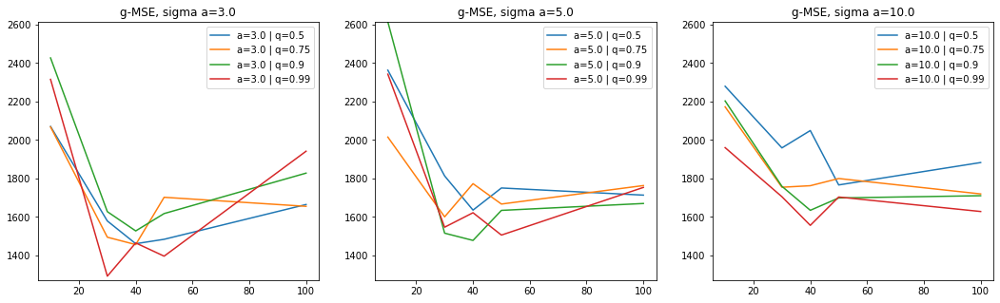

In [114]:
_=plt.figure(figsize=(18,5))
for si in range(len(sigma_a_list)):
    sa = sigma_a_list[si]
    _=plt.subplot(1, 3, si+1)
    for qil in range(len(q_list)):
        qi = q_list[qil]
        plt.plot(tree_count, MSE_results[:len(tree_count),si,qil], '-', label="a="+str(sa)+" | " +"q="+ str(qi))
        plt.ylim((np.min(MSE_results)-20, np.max(MSE_results)))
    _=plt.legend()
    plt.title("g-MSE, " + "sigma a=" + str(sa))

In [98]:
# coverage for tree_count x sigma_a x sigma_q
converage_results = np.zeros((len(tree_count), len(sigma_a_list), len(q_list)))
data = data = pd.read_csv("simulate_data/zaidi_data_A_var=25/0/zaidi_data_A_seed=0.csv")
tau=data.tau
for ti in range(len(tree_count)):
    tc = tree_count[ti]
    for si in range(len(sigma_a_list)):
        sa = sigma_a_list[si]
        for qil in range(len(q_list)):
            qi = q_list[qil]
            #print("tree count:",tc,  " --- sigma a:", sa,  " --- sigma q:", qi)
            base_file_name_g = f"all_runs_var=25_n_replications=1_n_samples={n_samples}_n_burn={burn_i}_n_trees_h={tc}_n_trees_g={tc}_n_chains=4_thin={thin}_sigma_a={sa}_sigma_q={qi}_alpha=0.95_beta=2.0_k=2.0_seed={seed_val}_g.npy"
            loaded_g = np.load(path + base_file_name_g)

            coverage_matrix=np.zeros((int(thin*n_samples)*n_chains, n))
            for i in range(n_chains):
                coverage_matrix[i*int(thin*n_samples):(i+1)*int(thin*n_samples)]=loaded_g[:,:,i,0].T
                
            q975 = np.quantile( coverage_matrix, q=0.975, axis=0)
            q025 = np.quantile( coverage_matrix, q=0.025, axis=0)
            U=np.array(tau<q975).astype(int)
            L= np.array(q025<tau).astype(int)
            converage_results[ti,si,qil] = sum(U*L)/n
            

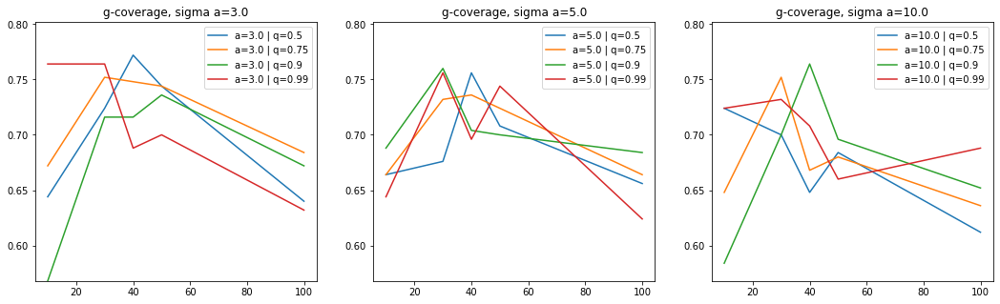

In [113]:
_=plt.figure(figsize=(18,5))
for si in range(len(sigma_a_list)):
    sa = sigma_a_list[si]
    _=plt.subplot(1, 3, si+1)
    for qil in range(len(q_list)):
        qi = q_list[qil]
        plt.plot(tree_count, converage_results[:len(tree_count),si,qil], '-', label="a="+str(sa)+" | " +"q="+ str(qi))
        plt.ylim((np.min(converage_results), np.max(converage_results)+.03))
    _=plt.legend()
    plt.title("g-coverage, " + "sigma a=" + str(sa))
    

In [ ]:
HAHN           : "MSE: 2037.39 ::::: BIAS: 25.85  ::::: COVERAGE: 0.62  ::::: MIL: 40.57"
JHCBART        : "MSE: 2806.27 ::::: BIAS: 28.71  ::::: COVERAGE: 0.88  ::::: MIL: 88.18"
    
CBARTMM 40/40 : "MSE: <1800.00 ::::: BIAS: xx.xx  ::::: COVERAGE: >0.65 ::::: MIL:<65.00"


In [ ]:
"""
Be sure to point performance is appears to be dependent on sigma prior specification for (a,q) which vary 
by problem depending on what the true sigma is relative to total variation.  ie. (a,q) are chosen but the 
sigma_b parameter in IG(a, sigma_b) is set according to the pooled STD(Y0, Y1).  
See plots in sigma_hyper_priors.ipnb for further discussion.
"""